# Capstone Project 2

- ### Introduction
- ### Data acquisition & processing
- ### Exploratory Data Analysis (EDA)
- ### Methodology
- ### Model Evaluation
- ### Result
- ### Conclustion and Future work

## Introduction

### Background
almart, the largest company by revenue in the world, operates over 10,500 stores in 19 countries, offering more than 75 million products. [1] Efficient sales prediction plays a pivotal role in managing Walmart's diverse operations, influencing decisions related to financing, business planning, inventory management, and human resources allocation. The higher the accuracy of the sales prediction model, the greater its contribution to the company's strategic direction. 

[1] Source: https://corporate.walmart.com/about


In this project, we utilize data provided by The Makridakis Open Forecasting Center (MOFC) at the University of Nicosia. The dataset comprises three tables. The first table contains sales data for approximately 3000 items across 10 stores located in Texas (TX), Wisconsin (WI), and California (CA), with three stores in TX, three in WI, and four in CA. The second table provides pricing information for each item in the respective stores, while the third table contains calendar data, including major events that occurred in the USA.

With a focus on time series forecasting, our objective is to leverage advanced forecasting algorithms to accurately predict sales trends, providing valuable insights for optimizing inventory management and strategic decision-making at Walmart.


## Data acquisition & processing

Import data from CSV files and convert it to pandas DataFrames

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
#import data from csv file
df_sell_price_original= pd.read_csv("data/m5-forecasting-accuracy/sell_prices.csv")
df_calender= pd.read_csv("data/m5-forecasting-accuracy/calendar.csv")
df_evaluation = pd.read_csv("data/m5-forecasting-accuracy/sales_train_evaluation.csv")

Evaluate the characteristics of each table

### sales_train_evaluation.csv evaluation

In [3]:
df_evaluation.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0


In [4]:
df_evaluation.shape

(30490, 1947)

In [5]:
df_evaluation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1947 entries, id to d_1941
dtypes: int64(1941), object(6)
memory usage: 452.9+ MB


This tells us that there should be 30490 product data linked with store id

In [7]:
df_evaluation.isnull().any().sum()

0

There is no null value in the table "sales_train_evaluation"

In [15]:
len(df_evaluation.columns[6:])

NameError: name 'df_evaluation' is not defined

The count of date data is 1941

In [11]:
date_col = df_evaluation.columns[6:]
s_temp = pd.Series(date_col)
s_temp = s_temp.duplicated()
s_temp = s_temp.loc[s_temp == 'False'].count()
s_temp

0

We can see that there is no duplicated date columns meaning there are 1941 date data

In [13]:
df_eva_product = df_evaluation.drop_duplicates(['store_id','item_id'])
table_prod_eva = df_evaluation.groupby('store_id')['item_id'].count().to_frame('Product_number')
table_prod_eva

,Product_number
store_id,
CA_1,3049
CA_2,3049
CA_3,3049
CA_4,3049
TX_1,3049
TX_2,3049
TX_3,3049
WI_1,3049
WI_2,3049


In [14]:
df_eva_product = df_evaluation.drop_duplicates(['store_id','item_id'])
table_prod_cat_eva = df_evaluation.groupby(['store_id','cat_id'])['item_id'].count().to_frame('Product_Quantitiy')
table_prod_cat_eva_reset_index = table_prod_cat_eva.reset_index()

In [15]:
table_prod_cat_eva_reset_index.head()

,store_id,cat_id,Product_Quantitiy
0,CA_1,FOODS,1437
1,CA_1,HOBBIES,565
2,CA_1,HOUSEHOLD,1047
3,CA_2,FOODS,1437
4,CA_2,HOBBIES,565


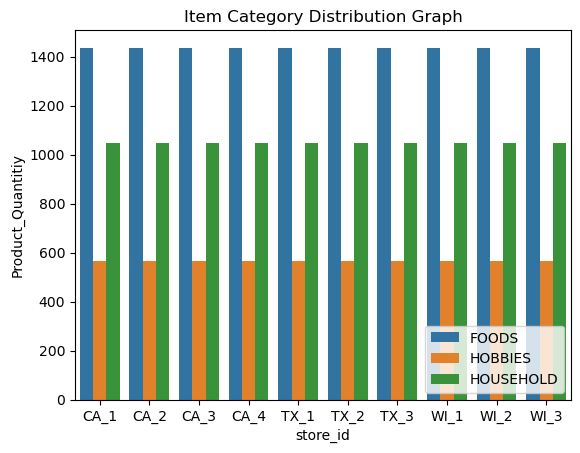

In [16]:
import seaborn as sns
sns.barplot(data = table_prod_cat_eva_reset_index, x = "store_id", y = 'Product_Quantitiy', hue = 'cat_id')
plt.title("Item Category Distribution Graph")
plt.legend(loc = 'lower right')
plt.show()

In [17]:
if df_eva_product.shape == df_evaluation.shape:
    print("There is no duplicate product in the table")

There is no duplicate product in the table


Lets see how many zeros are in this table

### sell_prices.csv evaluation

In [21]:
df_sell_price_original.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [22]:
df_sell_price_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6841121 entries, 0 to 6841120
Data columns (total 4 columns):
 #   Column      Dtype  
---  ------      -----  
 0   store_id    object 
 1   item_id     object 
 2   wm_yr_wk    int64  
 3   sell_price  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 208.8+ MB


In [23]:
df_sell_price_original.isnull().sum()

store_id      0
item_id       0
wm_yr_wk      0
sell_price    0
dtype: int64

We can see tha the week id has been linked to this table for the date. However, evaluation table was linked with date id.

We can see that there is no null value in this table.

### calendar.csv evaluation

In [47]:
df_calender.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [51]:
df_calender.tail()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0
1968,2016-06-19,11621,Sunday,2,6,2016,d_1969,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0


In [52]:
df_calender.shape

(1969, 14)

In [53]:
df_calender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          1969 non-null   object
 1   wm_yr_wk      1969 non-null   int64 
 2   weekday       1969 non-null   object
 3   wday          1969 non-null   int64 
 4   month         1969 non-null   int64 
 5   year          1969 non-null   int64 
 6   d             1969 non-null   object
 7   event_name_1  162 non-null    object
 8   event_type_1  162 non-null    object
 9   event_name_2  5 non-null      object
 10  event_type_2  5 non-null      object
 11  snap_CA       1969 non-null   int64 
 12  snap_TX       1969 non-null   int64 
 13  snap_WI       1969 non-null   int64 
dtypes: int64(7), object(7)
memory usage: 215.5+ KB


In [55]:
df_calender['event_name_1'] = df_calender['event_name_1'].fillna("No_Event")
df_calender['event_type_1'] = df_calender['event_type_1'].fillna("No_Event")
df_calender['event_name_2'] = df_calender['event_name_2'].fillna("No_Event")
df_calender['event_type_2'] = df_calender['event_type_2'].fillna("No_Event")

In [58]:
##### import seaborn as sns
from matplotlib import pyplot as plt
df_calender['date'] = pd.to_datetime(df_calender['date'], format = '%Y-%m-%d')

df_calender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          1969 non-null   datetime64[ns]
 1   wm_yr_wk      1969 non-null   int64         
 2   weekday       1969 non-null   object        
 3   wday          1969 non-null   int64         
 4   month         1969 non-null   int64         
 5   year          1969 non-null   int64         
 6   d             1969 non-null   object        
 7   event_name_1  1969 non-null   object        
 8   event_type_1  1969 non-null   object        
 9   event_name_2  1969 non-null   object        
 10  event_type_2  1969 non-null   object        
 11  snap_CA       1969 non-null   int64         
 12  snap_TX       1969 non-null   int64         
 13  snap_WI       1969 non-null   int64         
dtypes: datetime64[ns](1), int64(7), object(6)
memory usage: 215.5+ KB


This shows that every beginning week of Febuary 'wr_yr_wk' reset the week count and change the year

In [68]:
actual_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     1969 non-null   datetime64[ns]
 1   weekday  1969 non-null   object        
dtypes: datetime64[ns](1), object(1)
memory usage: 30.9+ KB


In [69]:

df_calender['day'] = df_calender['d'].str.split("_").str[1]
df_calender.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,wm_yr_wk_shift,day,d_shift
0,2011-01-29,11101,Saturday,1,1,2011,d_1,No_Event,No_Event,No_Event,No_Event,0,0,0,NaN,1,None
1,2011-01-30,11101,Sunday,2,1,2011,d_2,No_Event,No_Event,No_Event,No_Event,0,0,0,11101.0,2,1
2,2011-01-31,11101,Monday,3,1,2011,d_3,No_Event,No_Event,No_Event,No_Event,0,0,0,11101.0,3,2
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,No_Event,No_Event,No_Event,No_Event,1,1,0,11101.0,4,3
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,No_Event,No_Event,No_Event,No_Event,1,0,1,11101.0,5,4


In [75]:
df_week_check_All = df_calender.copy()
df_week_check_CA = df_week_check_All.groupby(['weekday','snap_CA'])['weekday'].count().to_frame('Count_of_Date').reset_index()
df_week_check_WI = df_week_check_All.groupby(['weekday','snap_WI'])['weekday'].count().to_frame('Count_of_Date').reset_index()
df_week_check_TX = df_week_check_All.groupby(['weekday','snap_TX'])['weekday'].count().to_frame('Count_of_Date').reset_index()
df_week_check_All = df_week_check_All.groupby(['weekday'])['weekday'].count().to_frame('Count_of_Date').reset_index()

In [76]:
df_week_check_All['CA_SNAP_YES'] =  df_week_check_CA['Count_of_Date'].loc[df_week_check_CA['snap_CA'] == 1].reset_index().drop('index', axis = 1)
df_week_check_All['CA_SNAP_NO'] =  df_week_check_CA['Count_of_Date'].loc[df_week_check_CA['snap_CA'] == 0].reset_index().drop('index', axis = 1)
df_week_check_All['WI_SNAP_YES'] =  df_week_check_WI['Count_of_Date'].loc[df_week_check_WI['snap_WI'] == 1].reset_index().drop('index', axis = 1)
df_week_check_All['WI_SNAP_NO'] =  df_week_check_WI['Count_of_Date'].loc[df_week_check_WI['snap_WI'] == 0].reset_index().drop('index', axis = 1)
df_week_check_All['TX_SNAP_YES'] =  df_week_check_TX['Count_of_Date'].loc[df_week_check_TX['snap_TX'] == 1].reset_index().drop('index', axis = 1)
df_week_check_All['TX_SNAP_NO'] =  df_week_check_TX['Count_of_Date'].loc[df_week_check_TX['snap_TX'] == 0].reset_index().drop('index', axis = 1)
df_week_check_All = df_week_check_All.drop('Count_of_Date', axis = 1)

In [78]:
df_week_check_All_test = pd.melt(df_week_check_All, id_vars= 'weekday', var_name="State and SNAP")

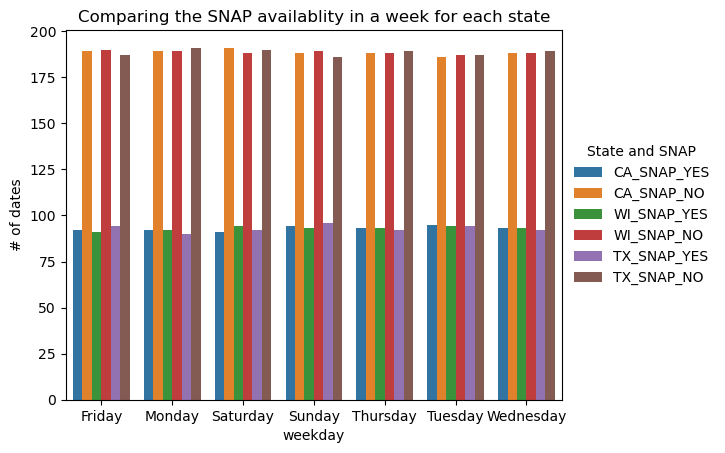

In [79]:
from matplotlib import pyplot as plt
ax = sns.barplot(data = df_week_check_All_test, x ='weekday', y = 'value', hue ="State and SNAP" )
sns.move_legend(ax, bbox_to_anchor=(1, 0.5), loc='center left', frameon=False)
plt.title("Comparing the SNAP availablity in a week for each state")
plt.ylabel("# of dates")
plt.show()

In [82]:
#Count the number of event type occured with "event_type_1"
df_calender.groupby('event_type_1')['date'].count().to_frame('Number of Event')

,Number of Event
event_type_1,
Cultural,37
National,52
No_Event,1807
Religious,55
Sporting,18


In [83]:
#Count the number of event type occured with "event_type_2"
df_calender.groupby('event_type_2')['date'].count().to_frame('Number of Event')

,Number of Event
event_type_2,
Cultural,4
No_Event,1964
Religious,1


In [84]:
#Count the number of event occured with "event_name_1"
df_calender.groupby('event_name_1')['date'].count().to_frame('Number of Event Occured').sort_values('Number of Event Occured')

,Number of Event Occured
event_name_1,
Father's day,4
Chanukah End,5
Thanksgiving,5
OrthodoxEaster,5
OrthodoxChristmas,5
NewYear,5
MartinLutherKingDay,5
LaborDay,5
IndependenceDay,5


In [85]:
#Count the number of event occured with "event_name_1"
df_calender.groupby('event_name_2')['date'].count().to_frame('Number of Event Occured').sort_values('Number of Event Occured')

,Number of Event Occured
event_name_2,
Cinco De Mayo,1
Easter,1
OrthodoxEaster,1
Father's day,2
No_Event,1964


### Modify the table

In [143]:
from tqdm import tqdm
import numpy as np
from sklearn.preprocessing import LabelEncoder

#Replace null values to 'no_event' in event columns
cat=['event_name_1','event_type_1','event_name_2','event_type_2']
for i in cat:
    df_calender.loc[:,i].fillna('no_event',inplace=True)

#Adding feature 'is_weekend' which will tell the weekend or not

df_calender['is_weekend']=0
df_calender['is_weekend'].loc[df_calender['wday'] == 1] =1
df_calender['is_weekend'].loc[df_calender['wday'] == 2] =1
#Adding feature 'month_day' which  will tell day of the month
df_calender['month_day']=0
df_calender['month_day']=df_calender.loc[:, 'date'].dt.day

#Adding feature 'month_week_number' which  will tell  week of the year
df_calender['week_number']= df_calender.loc[:,'date'].dt.isocalendar().week

#Adding feature 'events_per_day' which tells us number of events on particular day
df_calender['events_per_day'] = 0
df_calender['events_per_day'].loc[(df_calender['event_type_1'] != 'No_Event')] =1
df_calender['events_per_day'].loc[(df_calender['event_type_2'] != 'No_Event')] =2

#df_calender.loc[:, 'day'] = df_calender.loc[:,'d'].str.split("_").map(lambda x: x[1])
# df_calender['day'] = 0


df_calender.loc[:,'day'] = df_calender.loc[:,'d'].str.split("_").str[1].astype('string').astype('int32')
df_calender['day'].astype('string').astype('int8')
df_calender.loc[:, ('wday', 'month','snap_CA', 'snap_TX', 'snap_WI', 'is_weekend', 'month_day', 'week_number','events_per_day')] = df_calender.loc[:, ('wday', 'month','snap_CA', 'snap_TX', 'snap_WI', 'is_weekend', 'month_day', 'week_number','events_per_day')].astype('int32')

df_calender.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            1969 non-null   datetime64[ns]
 1   wm_yr_wk        1969 non-null   int64         
 2   weekday         1969 non-null   object        
 3   wday            1969 non-null   int64         
 4   month           1969 non-null   int64         
 5   year            1969 non-null   int64         
 6   d               1969 non-null   object        
 7   event_name_1    1969 non-null   object        
 8   event_type_1    1969 non-null   object        
 9   event_name_2    1969 non-null   object        
 10  event_type_2    1969 non-null   object        
 11  snap_CA         1969 non-null   int64         
 12  snap_TX         1969 non-null   int64         
 13  snap_WI         1969 non-null   int64         
 14  day             1969 non-null   object        
 15  is_w

C:\Users\yohei\AppData\Local\Temp\ipykernel_14040\1844176196.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_calender['is_weekend'].loc[df_calender['wday'] == 1] =1
C:\Users\yohei\AppData\Local\Temp\ipykernel_14040\1844176196.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_calender['is_weekend'].loc[df_calender['wday'] == 2] =1
C:\Users\yohei\AppData\Local\Temp\ipykernel_14040\1844176196.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-

In [157]:
dtype_dict = {
    'wm_yr_wk': 'int32',
    'wday': 'int8',
    'month': 'int8',
    'year': 'int16',
    'snap_CA': 'int8',
    'snap_WI': 'int8',
    'snap_TX': 'int8',
    'is_weekend': 'int8',
    'events_per_day': 'int8',
    'day': 'int32',
    'month_day': 'int32',
    'week_number': 'int32'
}

final_df=pd.melt(df_evaluation,id_vars=['id','item_id','dept_id','cat_id','store_id','state_id'],var_name='d',value_name='sell_quantity').astype({'sell_quantity' : 'int32'})
final_df=pd.merge(final_df,df_calender,on='d',how='left').astype(dtype_dict)
final_df=pd.merge(final_df,df_sell_price_original, on=['item_id','store_id','wm_yr_wk'], how='left').astype(dtype_dict)

In [164]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59181090 entries, 0 to 59181089
Data columns (total 27 columns):
 #   Column          Dtype         
---  ------          -----         
 0   id              object        
 1   item_id         object        
 2   dept_id         object        
 3   cat_id          object        
 4   store_id        object        
 5   state_id        object        
 6   d               object        
 7   sell_quantity   int32         
 8   date            datetime64[ns]
 9   wm_yr_wk        int32         
 10  weekday         object        
 11  wday            int8          
 12  month           int8          
 13  year            int16         
 14  event_name_1    object        
 15  event_type_1    object        
 16  event_name_2    object        
 17  event_type_2    object        
 18  snap_CA         int8          
 19  snap_TX         int8          
 20  snap_WI         int8          
 21  day             int32         
 22  is_weekend      

In [163]:
final_df.isna().sum()

id                       0
item_id                  0
dept_id                  0
cat_id                   0
store_id                 0
state_id                 0
d                        0
sell_quantity            0
date                     0
wm_yr_wk                 0
weekday                  0
wday                     0
month                    0
year                     0
event_name_1             0
event_type_1             0
event_name_2             0
event_type_2             0
snap_CA                  0
snap_TX                  0
snap_WI                  0
day                      0
is_weekend               0
month_day                0
week_number              0
events_per_day           0
sell_price        12299413
dtype: int64

In [89]:
final_df.groupby(['id'])[['id','date','sell_price']].head(10)

,id,date,sell_price
0,HOBBIES_1_001_CA_1_evaluation,2011-01-29,NaN
1,HOBBIES_1_002_CA_1_evaluation,2011-01-29,NaN
2,HOBBIES_1_003_CA_1_evaluation,2011-01-29,NaN
3,HOBBIES_1_004_CA_1_evaluation,2011-01-29,NaN
4,HOBBIES_1_005_CA_1_evaluation,2011-01-29,NaN
...,...,...,...
304895,FOODS_3_823_WI_3_evaluation,2011-02-07,2.50
304896,FOODS_3_824_WI_3_evaluation,2011-02-07,2.47
304897,FOODS_3_825_WI_3_evaluation,2011-02-07,4.00
304898,FOODS_3_826_WI_3_evaluation,2011-02-07,NaN


In [90]:
final_df['sell_price'] = final_df.groupby(['id'])['sell_price'].ffill()

In [91]:
final_df.isna().sum()

id                       0
item_id                  0
dept_id                  0
cat_id                   0
store_id                 0
state_id                 0
d                        0
sell_quantity            0
date                     0
wm_yr_wk                 0
weekday                  0
wday                     0
month                    0
year                     0
event_name_1             0
event_type_1             0
event_name_2             0
event_type_2             0
snap_CA                  0
snap_TX                  0
snap_WI                  0
day                      0
is_weekend               0
month_day                0
week_number              0
events_per_day           0
sell_price        12299413
dtype: int64

In [67]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59181090 entries, 0 to 59181089
Data columns (total 27 columns):
 #   Column          Dtype         
---  ------          -----         
 0   id              object        
 1   item_id         object        
 2   dept_id         object        
 3   cat_id          object        
 4   store_id        object        
 5   state_id        object        
 6   d               object        
 7   sell_quantity   int32         
 8   date            datetime64[ns]
 9   wm_yr_wk        int32         
 10  weekday         object        
 11  wday            int8          
 12  month           int8          
 13  year            int16         
 14  event_name_1    object        
 15  event_type_1    object        
 16  event_name_2    object        
 17  event_type_2    object        
 18  snap_CA         int8          
 19  snap_TX         int8          
 20  snap_WI         int8          
 21  day             int32         
 22  is_weekend      

In [68]:
final_df.loc[final_df['id'] == 'HOUSEHOLD_2_085_WI_3_evaluation'].isna().sum()

id                  0
item_id             0
dept_id             0
cat_id              0
store_id            0
state_id            0
d                   0
sell_quantity       0
date                0
wm_yr_wk            0
weekday             0
wday                0
month               0
year                0
event_name_1        0
event_type_1        0
event_name_2        0
event_type_2        0
snap_CA             0
snap_TX             0
snap_WI             0
day                 0
is_weekend          0
month_day           0
week_number         0
events_per_day      0
sell_price        826
dtype: int64

In [72]:
#List all the unique value for store_id and item_id combined
store_id_item_id = df_sell_price_original.loc[:, 'item_id'] + "_" + df_sell_price_original.loc[:, 'store_id'] 
storeid_storeid_list = store_id_item_id.unique()
#List all the unique value for ids 
id_list = final_df['id'].unique()
#Compare the both array to see if the length are correct then we can assume both tables have same amount of products
compare = len(id_list) == len(storeid_storeid_list)
print(compare)

True


In [125]:
final_df.isna().sum()

id                   0
item_id              0
dept_id              0
cat_id               0
store_id             0
state_id             0
d                    0
sell_quantity        0
date                 0
wm_yr_wk             0
weekday              0
wday                 0
month                0
year                 0
event_name_1         0
event_type_1         0
event_name_2         0
event_type_2         0
snap_CA              0
snap_TX              0
snap_WI              0
day                  0
is_weekend           0
month_day            0
week_number          0
events_per_day       0
sell_price           0
daily_sell           0
lag_1                0
lag_2                0
lag_3                0
lag_7                0
lag_14               0
lag_21               0
lag_28               0
lag_35               0
lag_42               0
lag_49               0
rolling_median_7     0
rolling_median_14    0
rolling_median_28    0
rolling_median_35    0
rolling_median_42    0
rolling_med

In [122]:
testing_table_final_df = final_df[['sell_quantity','date','item_id','store_id','wm_yr_wk']].loc[final_df['id'] == 'HOUSEHOLD_2_085_WI_3_evaluation'].reset_index()

In [123]:
testing_table_sell_df = df_sell_price_original[['item_id','store_id','wm_yr_wk','sell_price']].loc[(df_sell_price_original['item_id'] == 'HOUSEHOLD_2_085') & (df_sell_price_original['store_id'] == 'WI_3')].reset_index()

In [76]:
test_merge = pd.merge(testing_table_final_df, testing_table_sell_df, on = ['item_id','store_id','wm_yr_wk'] , how = 'left')

In [77]:
nalist = test_merge['wm_yr_wk'].loc[test_merge['sell_price'].isna()].unique()

In [124]:
testing_table_final_df.head()

,index,sell_quantity,date,item_id,store_id,wm_yr_wk
0,28622,0,2011-01-29,HOUSEHOLD_2_085,WI_3,11101
1,59112,0,2011-01-30,HOUSEHOLD_2_085,WI_3,11101
2,89602,0,2011-01-31,HOUSEHOLD_2_085,WI_3,11101
3,120092,0,2011-02-01,HOUSEHOLD_2_085,WI_3,11101
4,150582,0,2011-02-02,HOUSEHOLD_2_085,WI_3,11101


In [125]:
test1 = testing_table_final_df['wm_yr_wk'].unique()
test2 = testing_table_sell_df['wm_yr_wk'].unique()
len(test1) - len(test2)

114

In [126]:
diff_values = testing_table_final_df[~testing_table_final_df['wm_yr_wk'].isin(testing_table_sell_df['wm_yr_wk'])]['wm_yr_wk']

diff_values = diff_values.unique()

In [127]:
#Compare the difference between NaN wm_yr_wk and wm_yr_wk that is not in testing_table_sell_df
result = np.array_equal(nalist, diff_values)
print(result)

False


In [113]:
nalist

array([], dtype=int32)

In [84]:
final_df.shape

(59181090, 27)

In [85]:
final_df=final_df.dropna()

In [128]:
id_list = final_df['id'].unique()

compare = len(id_list) == len(storeid_storeid_list)
print(compare)

NameError: name 'storeid_storeid_list' is not defined

In [87]:
 len(id_list)

30490

In [88]:
final_df.shape

(46881677, 27)

In [89]:
#Test2

In [106]:
testing_table_final_df = final_df[['date','item_id','store_id','wm_yr_wk','sell_quantity','sell_price']].loc[final_df['id'] == 'HOUSEHOLD_1_020_WI_2_evaluation'].reset_index()
testing_table_sell_df = df_sell_price_original[['item_id','store_id','wm_yr_wk','sell_price']].loc[(df_sell_price_original['item_id'] == 'HOUSEHOLD_1_020') & (df_sell_price_original['store_id'] == 'WI_2')].reset_index()

In [129]:
test_merge = pd.merge(testing_table_final_df, testing_table_sell_df, on = ['item_id','store_id','wm_yr_wk'] , how = 'left')
nalist = test_merge['wm_yr_wk'].loc[test_merge['sell_price'].isna()].unique()

In [94]:
type(nalist)

numpy.ndarray

In [107]:
testing_table_final_df.isna().sum()

index               0
date                0
item_id             0
store_id            0
wm_yr_wk            0
sell_quantity       0
sell_price       1841
dtype: int64

In [112]:
testing_table_final_df.loc[testing_table_final_df['wm_yr_wk'] == 11617]

,index,date,item_id,store_id,wm_yr_wk,sell_quantity,sell_price
1939,59145086,2016-05-21,HOUSEHOLD_1_020,WI_2,11617,2,6.97
1940,59175576,2016-05-22,HOUSEHOLD_1_020,WI_2,11617,0,6.97


In [101]:
testing_table_final_df['sell_price'] = testing_table_final_df['sell_price'].ffill()

In [102]:
testing_table_final_df.isna().sum()

index               0
date                0
item_id             0
store_id            0
wm_yr_wk            0
sell_quantity       0
sell_price       1841
dtype: int64

In [103]:
testing_table_final_df=testing_table_final_df.dropna(subset=['unit_sold'])

In [104]:
test1 = testing_table_final_df['wm_yr_wk'].unique()
test2 = testing_table_sell_df['wm_yr_wk'].unique()
len(test1) - len(test2)

-4

In [119]:
diff_value_finals = testing_table_final_df[~testing_table_final_df['wm_yr_wk'].isin(testing_table_sell_df['wm_yr_wk'])]['wm_yr_wk']

diff_value_finals = diff_value_finals.unique()

diff_values_sell = testing_table_final_df[~testing_table_final_df['wm_yr_wk'].isin(testing_table_sell_df['wm_yr_wk'])]['wm_yr_wk']
diff_values_sell = diff_values_sell.unique()

#Compare the difference between NaN wm_yr_wk and wm_yr_wk that is not in testing_table_sell_df
result = np.array_equal(nalist, diff_value_finals)
print(result)

In [122]:
# Find unique elements in array1 that are not in array2
unique_to_array1 = np.setdiff1d(test1, test2)

# Find unique elements in array2 that are not in array1
unique_to_array2 = np.setdiff1d(test2, test1)

print("Unique to array1:", unique_to_array1)
print("Unique to array2:", unique_to_array2)

Unique to array1: []
Unique to array2: [11618 11619 11620 11621]


In [96]:
nalist

array([], dtype=int32)

In [97]:
final_df.shape

(46881677, 27)

In [167]:
final_df=final_df.dropna()

In [99]:
id_list = final_df['id'].unique()

compare = len(id_list) == len(storeid_storeid_list)
print(compare)

True


In [168]:
final_df.isna().sum()

id                0
item_id           0
dept_id           0
cat_id            0
store_id          0
state_id          0
d                 0
sell_quantity     0
date              0
wm_yr_wk          0
weekday           0
wday              0
month             0
year              0
event_name_1      0
event_type_1      0
event_name_2      0
event_type_2      0
snap_CA           0
snap_TX           0
snap_WI           0
day               0
is_weekend        0
month_day         0
week_number       0
events_per_day    0
sell_price        0
dtype: int64

In [169]:
final_df.loc[:, 'daily_sell'] = final_df.loc[:,'sell_price'] * final_df.loc[:,'sell_quantity']

In [103]:
#Create the csv based on current table for EDA (EXPLORATORY DATA ANALYSIS)
final_df.to_csv('final_df_EDA.csv')

In [104]:
added_column = []
from tqdm import tqdm

#Lags
lags = [1,2,3,7,14,21,28,35,42,49]
for i in tqdm(lags):
    final_df['lag_'+str(i)]=final_df.groupby(['id'])['daily_sell'].shift(i)
    added_column.append('lag_' + str(i))

#Rolling-Mean
window=[7,14,28,35,42,49,56]
for i in tqdm(window):
    final_df['rolling_median_'+str(i)]=final_df.groupby(['id'])['daily_sell'].transform(lambda s: s.rolling(i,center=False).median())
    added_column.append('rolling_median_'+str(i))

#Rolling-std
window=[7,14,28,35,42,49,56]
for i in tqdm(window):
    final_df['rolling_std_'+str(i)]=final_df.groupby(['id'])['daily_sell'].transform(lambda s: s.rolling(i,center=False).std())
    added_column.append('rolling_std_'+str(i))

#Replacing 'NaN' values for lag and rolling_ mean columns data with zero
for i in tqdm(added_column):
    final_df[i]=final_df[i].fillna(0)

100%|██████████| 24/24 [00:04<00:00,  5.70it/s]


In [106]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46881677 entries, 7 to 59181089
Data columns (total 52 columns):
 #   Column             Dtype         
---  ------             -----         
 0   id                 object        
 1   item_id            object        
 2   dept_id            object        
 3   cat_id             object        
 4   store_id           object        
 5   state_id           object        
 6   d                  object        
 7   sell_quantity      int32         
 8   date               datetime64[ns]
 9   wm_yr_wk           int32         
 10  weekday            object        
 11  wday               int8          
 12  month              int8          
 13  year               int16         
 14  event_name_1       object        
 15  event_type_1       object        
 16  event_name_2       object        
 17  event_type_2       object        
 18  snap_CA            int8          
 19  snap_TX            int8          
 20  snap_WI            int8    

In [107]:
final_df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d,sell_quantity,date,wm_yr_wk,...,rolling_median_42,rolling_median_49,rolling_median_56,rolling_std_7,rolling_std_14,rolling_std_28,rolling_std_35,rolling_std_42,rolling_std_49,rolling_std_56
7,HOBBIES_1_008_CA_1_evaluation,HOBBIES_1_008,HOBBIES_1,HOBBIES,CA_1,CA,d_1,12,2011-01-29,11101,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,HOBBIES_1_009_CA_1_evaluation,HOBBIES_1_009,HOBBIES_1,HOBBIES,CA_1,CA,d_1,2,2011-01-29,11101,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,HOBBIES_1_010_CA_1_evaluation,HOBBIES_1_010,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,HOBBIES_1_012_CA_1_evaluation,HOBBIES_1_012,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14,HOBBIES_1_015_CA_1_evaluation,HOBBIES_1_015,HOBBIES_1,HOBBIES,CA_1,CA,d_1,4,2011-01-29,11101,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_count = df.groupby(['day'])['id'].count().to_frame('Num_Product')
df_count.loc[df_count['Num_Product'] == 30490].count()

In [108]:
#Create the csv based on current table for Modeling
final_df.to_csv('final_df_modeling.csv')

In [1]:
import pandas as pd
dtype_dict = {
    'wm_yr_wk': 'int32',
    'wday': 'int8',
    'day': 'int32',
    'month': 'int8',
    'year': 'int32',
    'snap_CA': 'int8',
    'snap_WI': 'int8',
    'snap_TX': 'int8',
    'is_weekend': 'int8',
    'events_per_day': 'int8',
    'month_day': 'int32',
    'week_number': 'int32'
}

df = pd.read_csv('final_df_EDA.csv', dtype=dtype_dict)
df['date'] = pd.to_datetime(df['date'])
df = df.drop(['Unnamed: 0'], axis = 1)

In [2]:
import matplotlib.pyplot as plt

In [7]:
import seaborn as sns
from tqdm import tqdm


data_Overall_State = df.groupby(['state_id', pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_Sell')
data_Overall_State = data_Overall_State.reset_index()
data_Overall_Store = df.groupby(['store_id', pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_Sell')
data_Overall_Store = data_Overall_Store.reset_index()
total_sales_by_store_category = df.groupby(['cat_id', pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_Sell')
total_sales_by_store_category = total_sales_by_store_category.reset_index()

data_CA = df.loc[df['state_id'] == 'CA']
data_TX = df.loc[df['state_id'] == 'TX']
data_WI = df.loc[df['state_id'] == 'WI']
total_sales_by_store_CA = data_CA.groupby(['store_id', pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_Sell')
total_sales_by_store_CA = total_sales_by_store_CA.reset_index()
total_sales_by_store_TX = data_TX.groupby(['store_id', pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_Sell')
total_sales_by_store_TX = total_sales_by_store_TX.reset_index()
total_sales_by_store_WI = data_WI.groupby(['store_id', pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_Sell')
total_sales_by_store_WI = total_sales_by_store_WI.reset_index()


In [4]:
plt.figure(figsize=(30, 8))
sns.lineplot(x="date", y="Total_Sell",
             hue="state_id",
             data=data_Overall_State)
plt.legend( prop ={'size':18})
plt.title("Sales pattern of each State", fontsize = 30, weight = 'bold')

plt.ylabel("Daily total sales", fontsize=15)
plt.xlabel("Date", fontsize=15)
plt.show()

NameError: name 'plt' is not defined

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Text(0.5, 1.0, 'Texas')

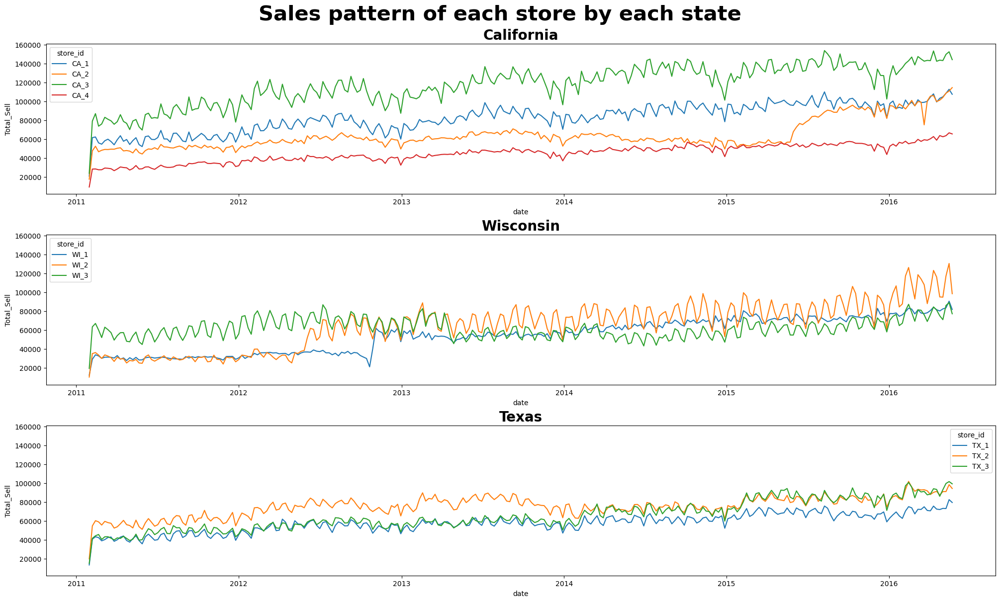

In [9]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Sales pattern of each store by each state', fontsize = 30, weight = 'bold')

snap_graph_CA = sns.lineplot(x = "date", y = "Total_Sell", hue="store_id", data = total_sales_by_store_CA, 
             ax = ax[0]) 
snap_graph_CA.set_title('California', size = 20, weight = 'bold')
snap_graph_WI =sns.lineplot(x = "date", y = "Total_Sell", hue="store_id",  data = total_sales_by_store_WI, 
             ax = ax[1]) 
snap_graph_WI.set_title('Wisconsin', size = 20, weight = 'bold')
snap_graph_TX =sns.lineplot(x = "date", y = "Total_Sell", hue="store_id", data = total_sales_by_store_TX, 
             ax = ax[2]) 
snap_graph_TX.set_title('Texas', size = 20, weight = 'bold')

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


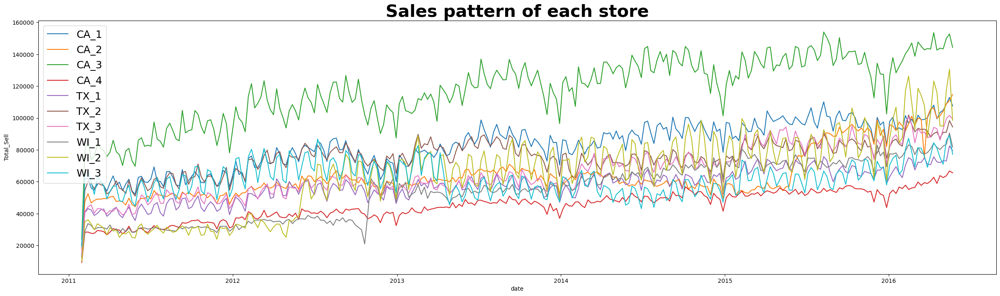

In [10]:
plt.figure(figsize=(30, 8))
sns.lineplot(x="date", y="Total_Sell",
             hue="store_id",
             data=data_Overall_Store)
plt.legend( prop ={'size':18})
plt.title("Sales pattern of each store", fontsize = 30, weight = 'bold')
plt.show()

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


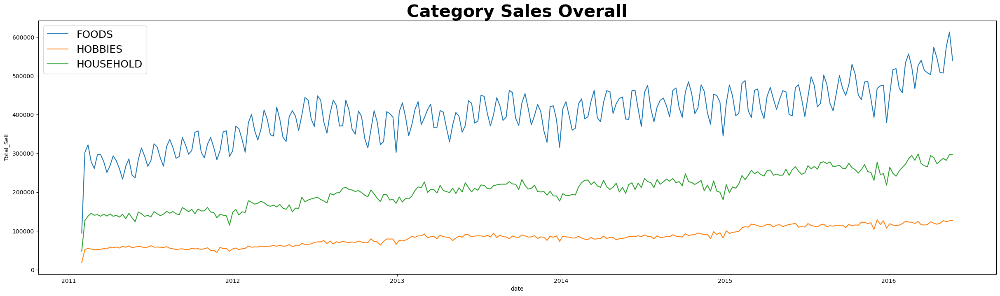

In [11]:
plt.figure(figsize=(30, 8))
sns.lineplot(x="date", y="Total_Sell",
             hue="cat_id",
             data=total_sales_by_store_category)
plt.legend( prop ={'size':18})
plt.title("Category Sales Overall", fontsize = 30, weight = 'bold')
plt.show()

In [12]:
data_merge_calender_date = df.groupby(['date','weekday'])['daily_sell'].sum().to_frame('Total_sell_per_day')

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


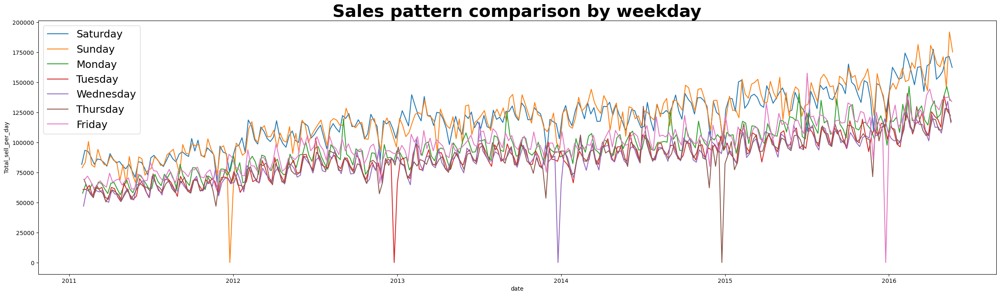

In [13]:
plt.figure(figsize=(30, 8))
sns.lineplot(x="date", y="Total_sell_per_day",
             hue="weekday",
             data=data_merge_calender_date)
plt.legend(prop ={'size':18})
plt.title("Sales pattern comparison by weekday", fontsize = 30, weight = 'bold')
plt.show()

In [34]:
#Create a table that creates mean of 'daily_sell' for every week
df_evaluate_CA = df.loc[df['state_id'] == 'CA'].copy()
df_evaluate_WI = df.loc[df['state_id'] == 'WI'].copy()
df_evaluate_TX = df.loc[df['state_id'] == 'TX'].copy()

date_s_CA = df_evaluate_CA.groupby(['snap_CA', pd.Grouper(key='date', freq='W')])['daily_sell'].mean().to_frame('Weekly_Sell').reset_index()
date_s_CA['snap_CA'] = date_s_CA['snap_CA'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_s_WI = df_evaluate_WI.groupby(['snap_WI', pd.Grouper(key='date', freq='W')])['daily_sell'].mean().to_frame('Weekly_Sell').reset_index()
date_s_WI['snap_WI'] = date_s_WI['snap_WI'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_s_TX = df_evaluate_TX.groupby(['snap_TX', pd.Grouper(key='date', freq='W')])['daily_sell'].mean().to_frame('Weekly_Sell').reset_index()
date_s_TX['snap_TX'] = date_s_TX['snap_TX'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Text(0.5, 1.0, 'Texas')

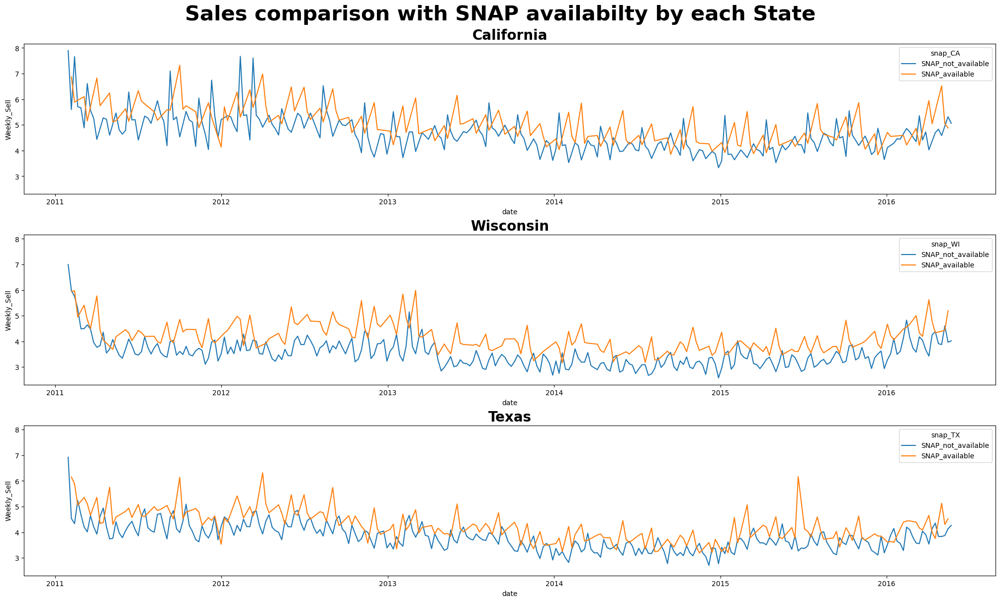

In [37]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Average Sales comparison with SNAP availabilty by each State', fontsize = 30, weight = 'bold')

snap_graph_CA = sns.lineplot(x = "date", y = "Weekly_Sell", hue="snap_CA", data = date_s_CA, 
             ax = ax[0]) 
snap_graph_CA.set_title('California', size = 20, weight = 'bold')
snap_graph_WI =sns.lineplot(x = "date", y = "Weekly_Sell", hue="snap_WI",  data = date_s_WI, 
             ax = ax[1]) 
snap_graph_WI.set_title('Wisconsin', size = 20, weight = 'bold')
snap_graph_TX =sns.lineplot(x = "date", y = "Weekly_Sell", hue="snap_TX", data = date_s_TX, 
             ax = ax[2]) 
snap_graph_TX.set_title('Texas', size = 20, weight = 'bold')

In [38]:
date_cat_D_CA = df_evaluate_CA.groupby(['cat_id','snap_CA',pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_daily_sell').reset_index()
date_cat_D_CA['snap_CA'] = date_cat_D_CA['snap_CA'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_cat_D_WI = df_evaluate_WI.groupby(['cat_id','snap_WI',pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_daily_sell').reset_index()
date_cat_D_WI['snap_WI'] = date_cat_D_WI['snap_WI'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_cat_D_TX = df_evaluate_TX.groupby(['cat_id','snap_TX',pd.Grouper(key='date', freq='W')])['daily_sell'].sum().to_frame('Total_daily_sell').reset_index()
date_cat_D_TX['snap_TX'] = date_cat_D_TX['snap_TX'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_cat_D_CA['cat_id_SNAP'] = date_cat_D_CA['cat_id'] +'_'+date_cat_D_CA['snap_CA']
date_cat_D_WI['cat_id_SNAP'] = date_cat_D_WI['cat_id'] +'_'+date_cat_D_WI['snap_WI']
date_cat_D_TX['cat_id_SNAP'] = date_cat_D_TX['cat_id'] +'_'+date_cat_D_TX['snap_TX']

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

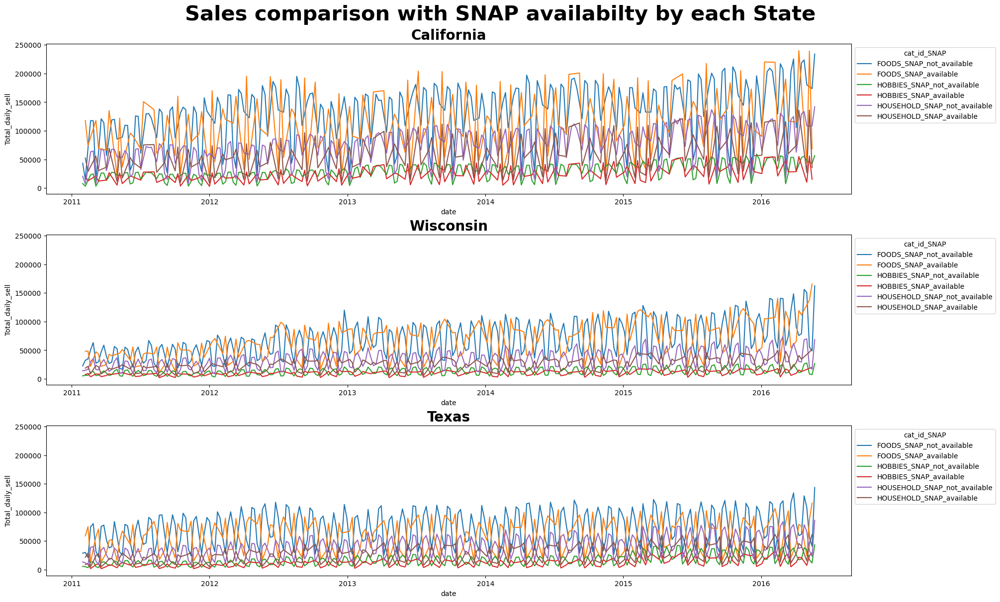

In [39]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Sales comparison with SNAP availabilty by each State', fontsize = 30, weight = 'bold')

snap_graph_CA = sns.lineplot(x = "date", y = "Total_daily_sell", hue="cat_id_SNAP", data = date_cat_D_CA, 
             ax = ax[0]) 
snap_graph_CA.set_title('California', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_graph_CA, "upper left", bbox_to_anchor=(1, 1))

snap_graph_WI =sns.lineplot(x = "date", y = "Total_daily_sell", hue="cat_id_SNAP",  data = date_cat_D_WI, 
             ax = ax[1]) 
snap_graph_WI.set_title('Wisconsin', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_graph_WI, "upper left", bbox_to_anchor=(1, 1))

snap_graph_TX =sns.lineplot(x = "date", y = "Total_daily_sell", hue="cat_id_SNAP", data = date_cat_D_TX, 
             ax = ax[2]) 
snap_graph_TX.set_title('Texas', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_graph_TX, "upper left", bbox_to_anchor=(1, 1))

In [40]:
date_cat_W_CA = df_evaluate_CA.groupby(['cat_id','snap_CA',pd.Grouper(key='date', freq='W')])['daily_sell'].mean().to_frame('Weekly_Mean_Sell').reset_index()
date_cat_W_CA['snap_CA'] = date_cat_W_CA['snap_CA'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_cat_W_WI = df_evaluate_WI.groupby(['cat_id','snap_WI',pd.Grouper(key='date', freq='W')])['daily_sell'].mean().to_frame('Weekly_Mean_Sell').reset_index()
date_cat_W_WI['snap_WI'] = date_cat_W_WI['snap_WI'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_cat_W_TX = df_evaluate_TX.groupby(['cat_id','snap_TX',pd.Grouper(key='date', freq='W')])['daily_sell'].mean().to_frame('Weekly_Mean_Sell').reset_index()
date_cat_W_TX['snap_TX'] = date_cat_W_TX['snap_TX'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

date_cat_W_CA['cat_id_SNAP'] = date_cat_W_CA['cat_id'] +'_'+date_cat_W_CA['snap_CA']
date_cat_W_WI['cat_id_SNAP'] = date_cat_W_WI['cat_id'] +'_'+date_cat_W_WI['snap_WI']
date_cat_W_TX['cat_id_SNAP'] = date_cat_W_TX['cat_id'] +'_'+date_cat_W_TX['snap_TX']

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

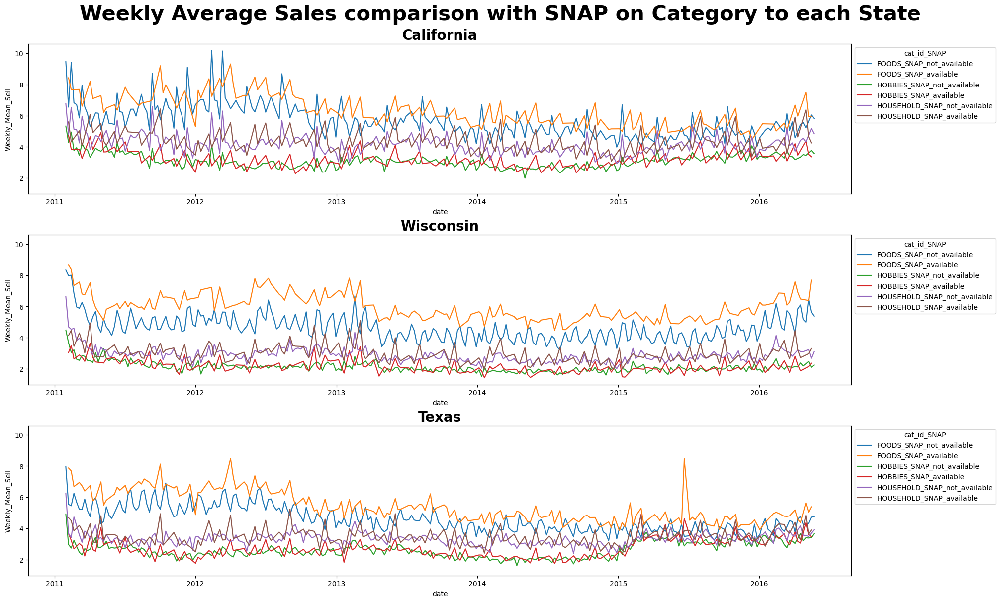

In [41]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Weekly Average Sales comparison with SNAP on Category to each State', fontsize = 30, weight = 'bold')

snap_W_graph_CA = sns.lineplot(x = "date", y = "Weekly_Mean_Sell", hue="cat_id_SNAP", data = date_cat_W_CA, 
             ax = ax[0]) 
snap_W_graph_CA.set_title('California', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_W_graph_CA, "upper left", bbox_to_anchor=(1, 1))

snap_W_graph_WI =sns.lineplot(x = "date", y = "Weekly_Mean_Sell", hue="cat_id_SNAP",  data = date_cat_W_WI, 
             ax = ax[1]) 
snap_W_graph_WI.set_title('Wisconsin', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_W_graph_WI, "upper left", bbox_to_anchor=(1, 1))

snap_W_graph_TX =sns.lineplot(x = "date", y = "Weekly_Mean_Sell", hue="cat_id_SNAP", data = date_cat_W_TX, 
             ax = ax[2]) 
snap_W_graph_TX.set_title('Texas', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_W_graph_TX, "upper left", bbox_to_anchor=(1, 1))

In [42]:
cat_snap_sell_q_CA = df_evaluate_CA.groupby(['cat_id','snap_CA',pd.Grouper(key='date', freq='W')])['sell_quantity'].mean().to_frame('Weekly_Mean_Items_Sold').reset_index()
cat_snap_sell_q_CA['snap_CA'] = cat_snap_sell_q_CA['snap_CA'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

cat_snap_sell_q_WI = df_evaluate_WI.groupby(['cat_id','snap_WI',pd.Grouper(key='date', freq='W')])['sell_quantity'].mean().to_frame('Weekly_Mean_Items_Sold').reset_index()
cat_snap_sell_q_WI['snap_WI'] = cat_snap_sell_q_WI['snap_WI'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

cat_snap_sell_q_TX = df_evaluate_TX.groupby(['cat_id','snap_TX',pd.Grouper(key='date', freq='W')])['sell_quantity'].mean().to_frame('Weekly_Mean_Items_Sold').reset_index()
cat_snap_sell_q_TX['snap_TX'] = cat_snap_sell_q_TX['snap_TX'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

cat_snap_sell_q_CA['cat_id_SNAP'] = cat_snap_sell_q_CA['cat_id'] +'_'+cat_snap_sell_q_CA['snap_CA']
cat_snap_sell_q_WI['cat_id_SNAP'] = cat_snap_sell_q_WI['cat_id'] +'_'+cat_snap_sell_q_WI['snap_WI']
cat_snap_sell_q_TX['cat_id_SNAP'] = cat_snap_sell_q_TX['cat_id'] +'_'+cat_snap_sell_q_TX['snap_TX']

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

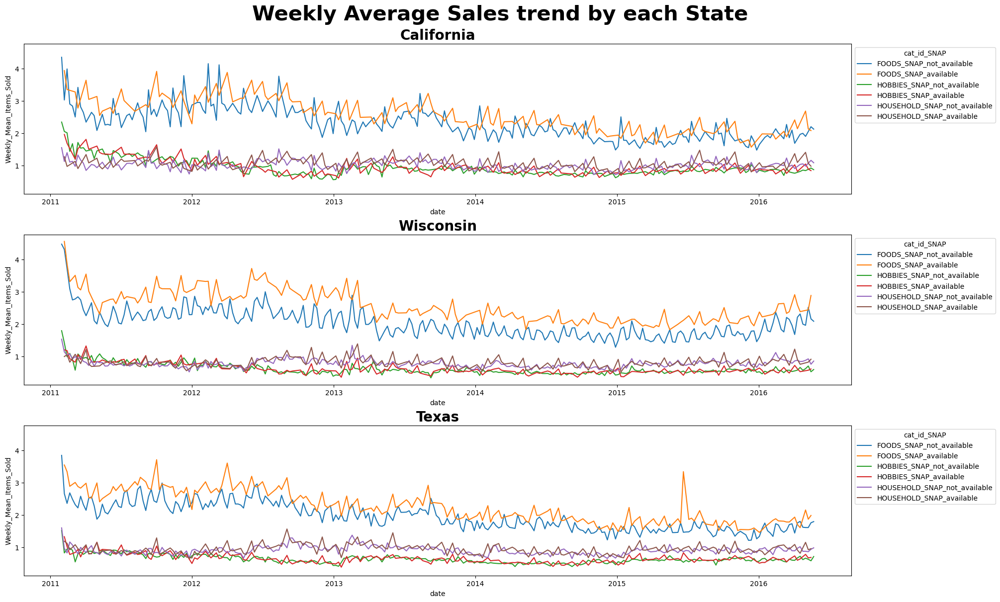

In [43]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Weekly Average Sales trend by each State', fontsize = 30, weight = 'bold')

snap_cat_graph_CA = sns.lineplot(x = "date", y = "Weekly_Mean_Items_Sold", hue="cat_id_SNAP", data = cat_snap_sell_q_CA, 
             ax = ax[0]) 
snap_cat_graph_CA.set_title('California', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_cat_graph_CA, "upper left", bbox_to_anchor=(1, 1))

snap_cat_graph_WI =sns.lineplot(x = "date", y = "Weekly_Mean_Items_Sold", hue="cat_id_SNAP",  data = cat_snap_sell_q_WI, 
             ax = ax[1]) 
snap_cat_graph_WI.set_title('Wisconsin', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_cat_graph_WI, "upper left", bbox_to_anchor=(1, 1))

snap_cat_graph_TX =sns.lineplot(x = "date", y = "Weekly_Mean_Items_Sold", hue="cat_id_SNAP", data = cat_snap_sell_q_TX, 
             ax = ax[2]) 
snap_cat_graph_TX.set_title('Texas', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_cat_graph_TX, "upper left", bbox_to_anchor=(1, 1))

In [44]:
cat_snap_sell_q_m_CA = df_evaluate_CA.groupby(['cat_id','snap_CA',pd.Grouper(key='date', freq='M')])['sell_quantity'].mean().to_frame('Monthly_Mean_Items_Sold').reset_index()
cat_snap_sell_q_m_CA['snap_CA'] = cat_snap_sell_q_m_CA['snap_CA'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

cat_snap_sell_q_m_WI = df_evaluate_WI.groupby(['cat_id','snap_WI',pd.Grouper(key='date', freq='M')])['sell_quantity'].mean().to_frame('Monthly_Mean_Items_Sold').reset_index()
cat_snap_sell_q_m_WI['snap_WI'] = cat_snap_sell_q_m_WI['snap_WI'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

cat_snap_sell_q_m_TX = df_evaluate_TX.groupby(['cat_id','snap_TX',pd.Grouper(key='date', freq='M')])['sell_quantity'].mean().to_frame('Monthly_Mean_Items_Sold').reset_index()
cat_snap_sell_q_m_TX['snap_TX'] = cat_snap_sell_q_m_TX['snap_TX'].replace([0, 1], ['SNAP_not_available', 'SNAP_available'], regex=True )

cat_snap_sell_q_m_CA['cat_id_SNAP'] = cat_snap_sell_q_m_CA['cat_id'] +'_'+cat_snap_sell_q_m_CA['snap_CA']
cat_snap_sell_q_m_WI['cat_id_SNAP'] = cat_snap_sell_q_m_WI['cat_id'] +'_'+cat_snap_sell_q_m_WI['snap_WI']
cat_snap_sell_q_m_TX['cat_id_SNAP'] = cat_snap_sell_q_m_TX['cat_id'] +'_'+cat_snap_sell_q_m_TX['snap_TX']

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

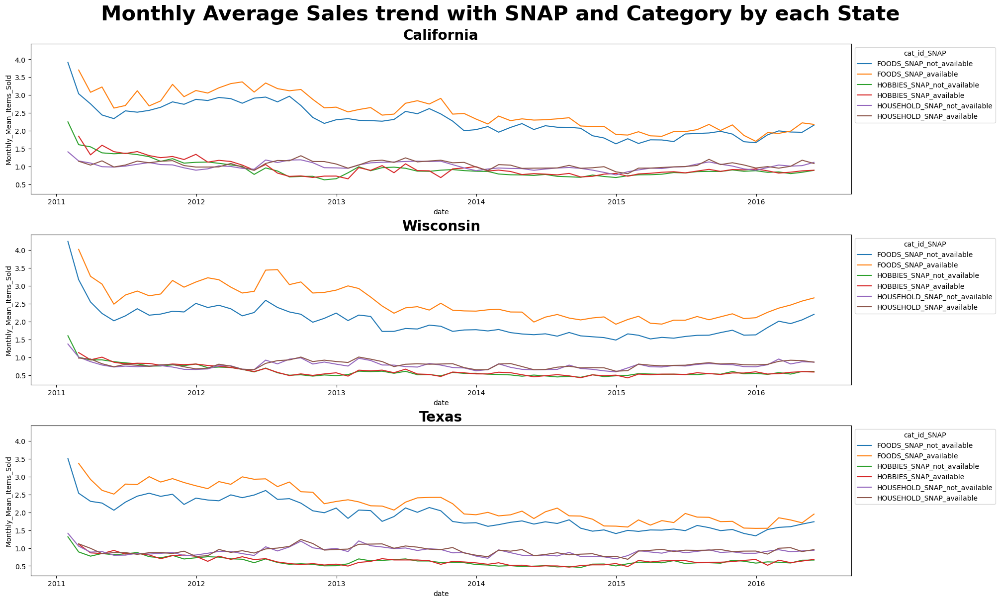

In [45]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Monthly Average Sales trend with SNAP and Category by each State', fontsize = 30, weight = 'bold')

snap_cat_graph_month_CA = sns.lineplot(x = "date", y = "Monthly_Mean_Items_Sold", hue="cat_id_SNAP", data = cat_snap_sell_q_m_CA, 
             ax = ax[0]) 
snap_cat_graph_month_CA.set_title('California', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_cat_graph_month_CA, "upper left", bbox_to_anchor=(1, 1))

snap_cat_graph_month_WI =sns.lineplot(x = "date", y = "Monthly_Mean_Items_Sold", hue="cat_id_SNAP",  data = cat_snap_sell_q_m_WI, 
             ax = ax[1]) 
snap_cat_graph_month_WI.set_title('Wisconsin', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_cat_graph_month_WI, "upper left", bbox_to_anchor=(1, 1))

snap_cat_graph_month_TX =sns.lineplot(x = "date", y = "Monthly_Mean_Items_Sold", hue="cat_id_SNAP", data = cat_snap_sell_q_m_TX, 
             ax = ax[2]) 
snap_cat_graph_month_TX.set_title('Texas', size = 20, weight = 'bold')
#Move the legend to the out of the box
sns.move_legend(snap_cat_graph_month_TX, "upper left", bbox_to_anchor=(1, 1))

In [46]:
sell_month_CA = df_evaluate_CA.groupby(['year','month'])['sell_quantity'].sum().to_frame('sell_q_per_month').reset_index()

sell_month_WI = df_evaluate_WI.groupby(['year','month'])['sell_quantity'].sum().to_frame('sell_q_per_month').reset_index()

sell_month_TX = df_evaluate_TX.groupby(['year','month'])['sell_quantity'].sum().to_frame('sell_q_per_month').reset_index()

C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\yohei\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

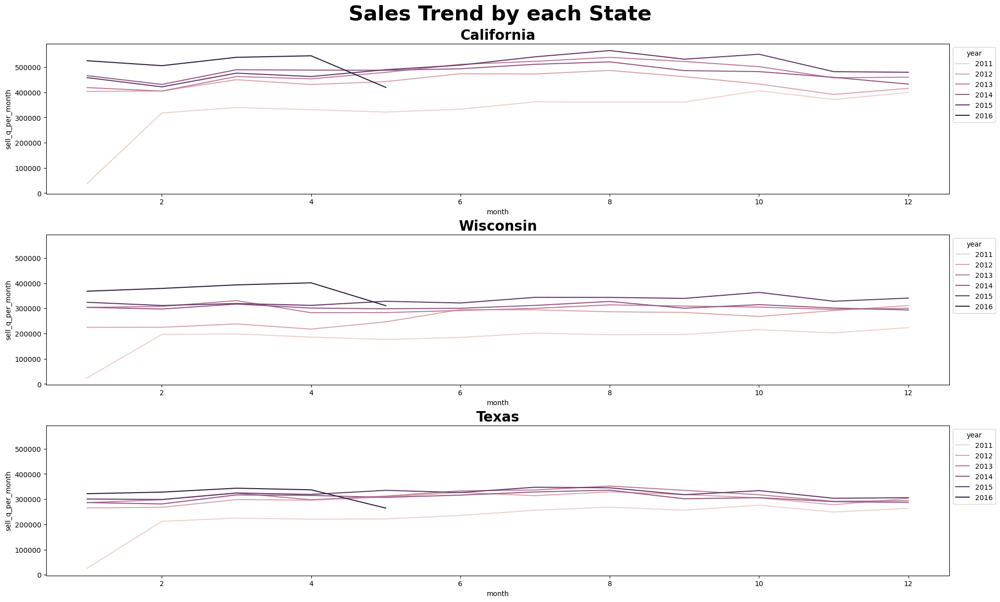

In [47]:
fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Sales Trend by each State', fontsize = 30, weight = 'bold')

month_graph_CA = sns.lineplot(x = "month", y = "sell_q_per_month", hue="year", data = sell_month_CA, 
                              ax = ax[0]) 
month_graph_CA.set_title('California', size = 20, weight = 'bold')
sns.move_legend(month_graph_CA, "upper left", bbox_to_anchor=(1, 1))

month_graph_WI =sns.lineplot(x = "month", y = "sell_q_per_month", hue="year",  data = sell_month_WI, 
                             ax = ax[1]) 
month_graph_WI.set_title('Wisconsin', size = 20, weight = 'bold')
sns.move_legend(month_graph_WI, "upper left", bbox_to_anchor=(1, 1))

month_graph_TX =sns.lineplot(x = "month", y = "sell_q_per_month", hue="year", data = sell_month_TX, 
                             ax = ax[2]) 
month_graph_TX.set_title('Texas', size = 20, weight = 'bold')
sns.move_legend(month_graph_TX, "upper left", bbox_to_anchor=(1, 1))

### Methodology

#### BASELINE MODELING

In [6]:
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
import numpy as np

In [9]:
#Convert all the string values in the table into int using labelEncoder
from sklearn.preprocessing import LabelEncoder

le_event = LabelEncoder()  

le_itemid = LabelEncoder() 
le_deptid = LabelEncoder() 
le_catid = LabelEncoder() 
le_stateid = LabelEncoder() 
le_storeid = LabelEncoder() 

event_category=['event_name_1','event_type_1','event_name_2','event_type_2']


# Combine the columns into a single series
combined_series = pd.concat([df['event_name_1'], df['event_type_1'], df['event_name_2'], df['event_type_2']])
#Create a encode list based on event type and event name since the data name are not overlapping
le_event.fit(combined_series)
for i in event_category:
    df[i]=le_event.transform(df[i])


#Create a encode list for item_id
le_itemid.fit(df['item_id'])
df['item_id'] = le_itemid.transform(df['item_id'])

#Create a encode list for dept_id
le_deptid.fit(df['dept_id'])
df['dept_id'] = le_deptid.transform(df['dept_id'])

#Create a encode list for cat_id
le_catid.fit(df['cat_id'])
df['cat_id'] = le_catid.transform(df['cat_id'])

#Create a encode list for store_id
le_stateid.fit(df['store_id'])
df['store_id'] = le_stateid.transform(df['store_id'])

#Create a encode list for state_id
le_storeid.fit(df['state_id'])
df['state_id'] = le_storeid.transform(df['state_id'])

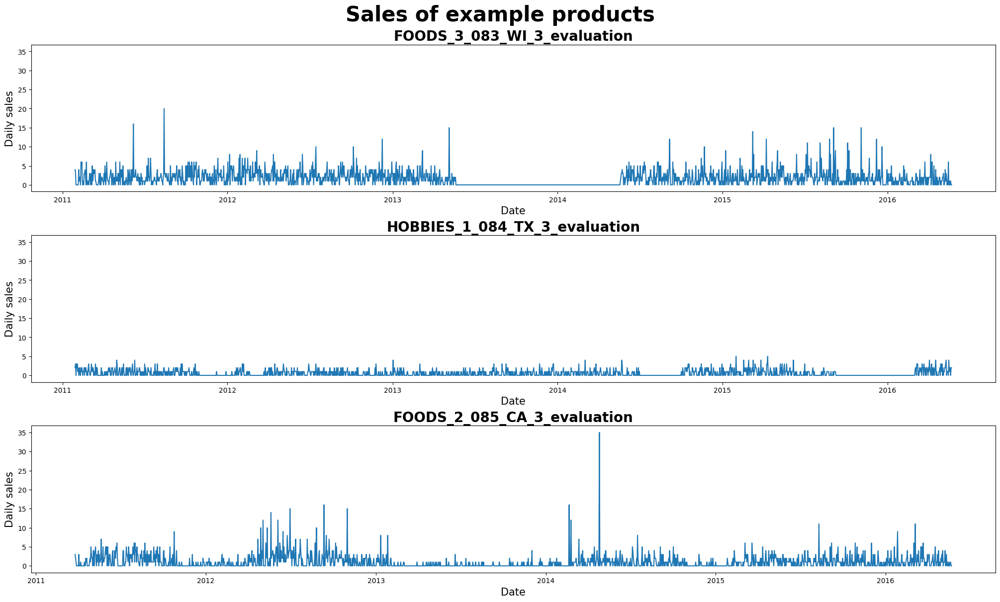

In [13]:

#Plot 3 example items that I randomly selected
multi_items = ['FOODS_3_083_WI_3_evaluation', 'HOBBIES_1_084_TX_3_evaluation', 'FOODS_2_085_CA_3_evaluation']

fig,ax =  plt.subplots(nrows= 3, ncols=1, figsize = ( 20, 12), constrained_layout=True, sharey=True) 

fig.suptitle('Sales of example products', fontsize = 30, weight = 'bold')
i = 0
for product in multi_items:
    data = df.loc[df['id'] ==  product,['date','sell_quantity']]
    graph_item = sns.lineplot(x = "date", y = 'sell_quantity', data = data, 
                 ax = ax[i]) 
    i = i + 1
    graph_item.set_title(product, size = 20, weight = 'bold')
    graph_item.set_ylabel("Daily sales", fontsize=15)
    graph_item.set_xlabel("Date", fontsize=15)


## Transform the data


Testing with few products

In [16]:
test_df = df[['id','date','day','daily_sell']].loc[ (df['id'] == 'HOUSEHOLD_1_278_CA_3_evaluation') | (df['id'] == 'FOODS_3_083_WI_3_evaluation') | (df['id'] == 'HOBBIES_1_084_TX_3_evaluation') | (df['id'] == 'FOODS_2_085_CA_3_evaluation') | (df['id'] == 'FOODS_3_083_WI_3_evaluation') ].sort_values(by= ['id','date']).reset_index(drop=True)


### Create a table with non-zero values

In [82]:
#Flag the continous zero values based on the threshold
def add_gap_indicator(data, id_col = 'id', day_col = 'day', sale_col = 'daily_sell', short_gap_threshold=7, long_gap_threshold=70):

    data["gap_indicator"] = 0
    test_list = data[id_col].unique()
    for product_id in test_list:
        sales_gaps = (data[id_col] == product_id) & (data[sale_col] == 0)
        consecutive_gaps = sales_gaps.diff() == 1
        gap_start_day_li = data[consecutive_gaps].loc[(data[id_col] == product_id) & data[sale_col] == 0].index.tolist()
        gap_end_plus_day_li = data[consecutive_gaps].loc[(data[id_col] == product_id) & data[sale_col] != 0].index.tolist()
    
        #max date of each product
        max_day = data.loc[(data[id_col] == product_id),day_col].max()
        #the last day sales information
        last_day_value = data.loc[(data[id_col] == product_id), sale_col].iloc[-1]
        last_day_index = data.loc[(data[id_col] == product_id)].tail(1).index[0]
        #the first day sales information
        first_day_value = data.loc[(data[id_col] == product_id), sale_col].iloc[0]
        first_day_index = data.loc[(data[id_col] == product_id)].head(1).index[0]
        
        #max start date on the list
        max_start_list_day = data.loc[gap_start_day_li[len(gap_start_day_li)- 1],'day']
        #if the zero continues until the last day
        if ((max_start_list_day != max_day) and (last_day_value == 0) and (last_day_index not in gap_end_plus_day_li)):
            gap_end_plus_day_li.append(last_day_index)
        #If only the last day is zero
        if (max_start_list_day == max_day):
            data.loc[(data[id_col] == product_id) & (data[day_col] == max_start_list_day), "gap_indicator"] = 1
        #If the first date is zero
        if ((first_day_value == 0) and (first_day_index not in gap_start_day_li)):
            gap_start_day_li.insert(0,first_day_index)
        # Check if there are any gaps for this product
        if len(gap_start_day_li) != 0:
            for i in range(len(gap_end_plus_day_li)):
                gap_start = data.loc[gap_start_day_li[i],'day']
                gap_end = data.loc[gap_end_plus_day_li[i],'day'] - 1
                gap_length = gap_end - gap_start
    
                if gap_length <= short_gap_threshold:
                    gap_value = 1  # Short gap (less than 7 days)
                elif gap_length <= long_gap_threshold:
                    gap_value = 2  # Medium gap (between 7 and 70 days)
                else:
                    gap_value = 3  # Long gap (over 70 days)
                data.loc[(data[id_col] == product_id) & (data[day_col] >= gap_start) & (data[day_col] <= gap_end), "gap_indicator"] = gap_value


    return data

In [20]:
single_df = test_df.loc[test_df['id'] == 'FOODS_3_083_WI_3_evaluation',['date','daily_sell']].copy().set_index('date')
#Data for Trimming
single_df_mod = test_df.loc[test_df['id'] == 'FOODS_3_083_WI_3_evaluation',['id','date','day','daily_sell']].copy()
# single_df_mod = test_df.loc[test_df['id'] == 'FOODS_3_083_WI_3_evaluation',['date','daily_sell_mod']].set_index('date')


## Review the data


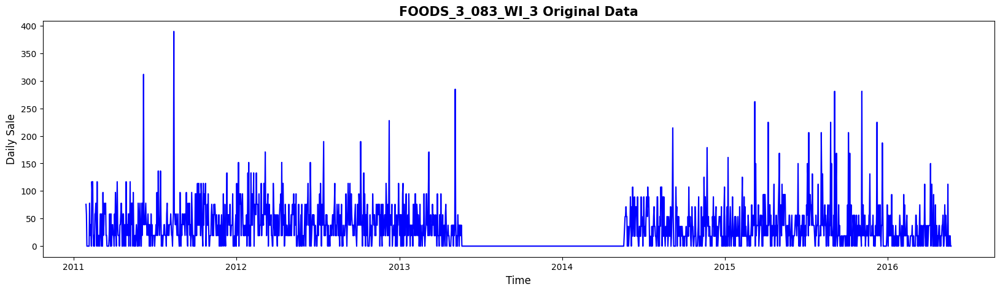

In [23]:
size = (20, 5)
plt.figure(figsize=size)
sns.lineplot(data = single_df, y = 'daily_sell', x ='date', color = 'blue')
plt.title("FOODS_3_083_WI_3 Original Data", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

In [24]:
single_df_review = add_gap_indicator(single_df_mod.copy())
#Find the last date of the continous zeros with large gap
after_gap_day = single_df_review.loc[single_df_review['gap_indicator'] == 3,'day'].tail(1).values[0]
#Creating a table without huge gap
single_df_review_ARIMA = single_df_review.loc[single_df_review['day'] > after_gap_day,['date','daily_sell']].set_index('date')


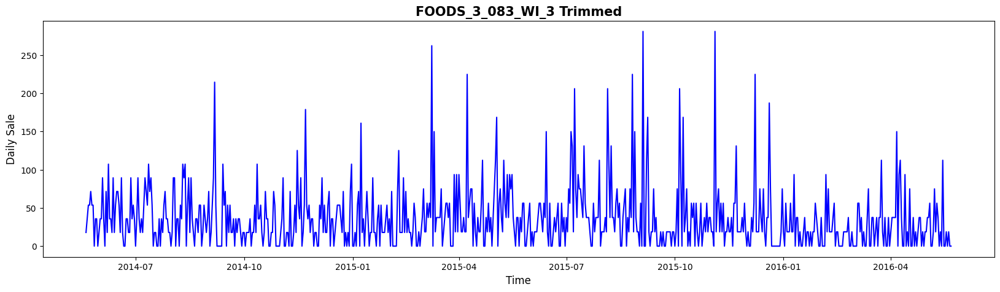

In [25]:
size = (20, 5)
plt.figure(figsize=size)
plt.plot(single_df_review_ARIMA, color = 'blue')
plt.title("FOODS_3_083_WI_3 Trimmed", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

## Decomposition


Text(0.5, 1.0, 'Residue')

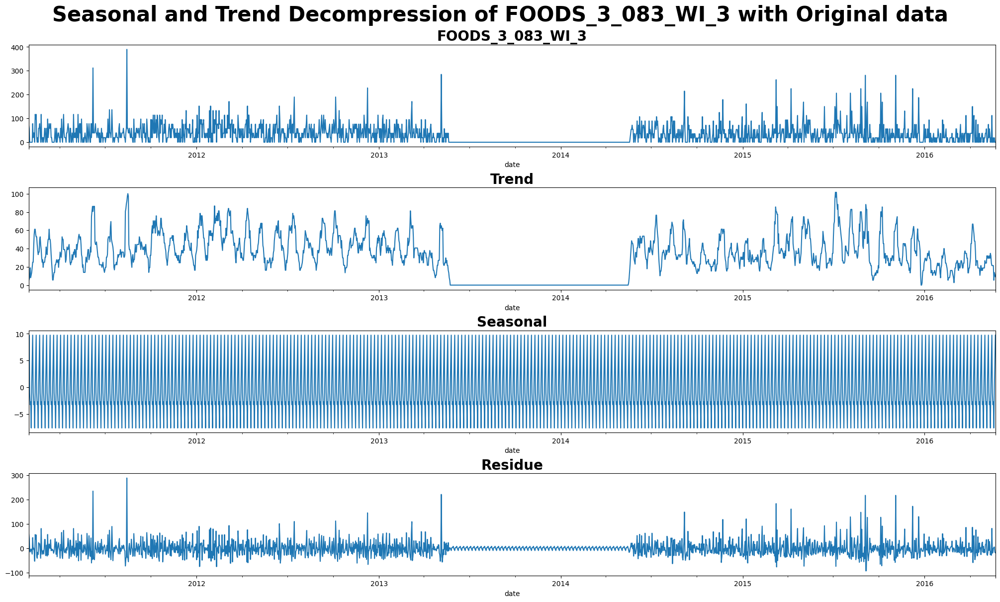

In [27]:
from statsmodels.tsa.seasonal import seasonal_decompose 
decom = seasonal_decompose(single_df, model="additive", extrapolate_trend="freq")

fig,ax =  plt.subplots(nrows= 4, ncols=1, figsize = ( 20, 12), constrained_layout=True) 

fig.suptitle('Seasonal and Trend Decompression of FOODS_3_083_WI_3 with Original data', fontsize = 30, weight = 'bold')

single_data = decom.observed.plot(ax = ax[0]) 
single_data.set_title('FOODS_3_083_WI_3', size = 20, weight = 'bold')
single_data_trend = decom.trend.plot(ax = ax[1]) 
single_data_trend.set_title('Trend', size = 20, weight = 'bold')
single_data_seasonal = decom.seasonal.plot(ax = ax[2]) 
single_data_seasonal.set_title('Seasonal', size = 20, weight = 'bold')
single_data_resid = decom.resid.plot(ax = ax[3]) 
single_data_resid.set_title('Residue', size = 20, weight = 'bold')

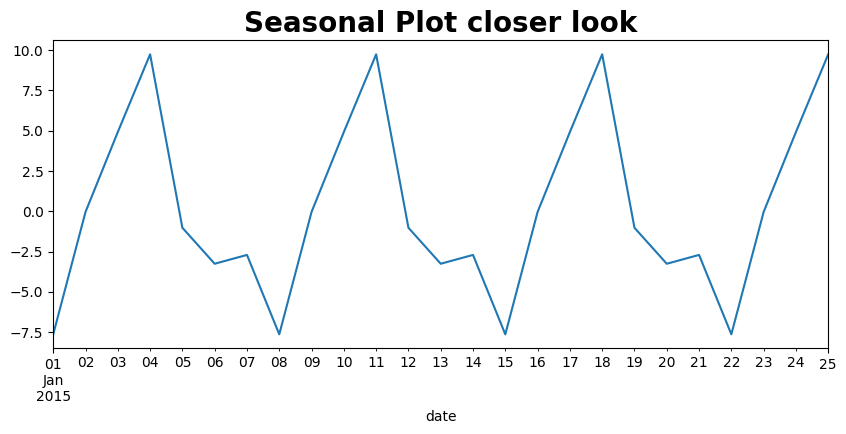

In [28]:
fig,ax =  plt.subplots(figsize = (10, 4)) 
fig = decom.seasonal['2015-01-01':'2015-01-25'].plot()
plt.title("Seasonal Plot closer look", fontsize = 20, weight = 'bold')
plt.show()

Text(0.5, 1.0, 'Residue')

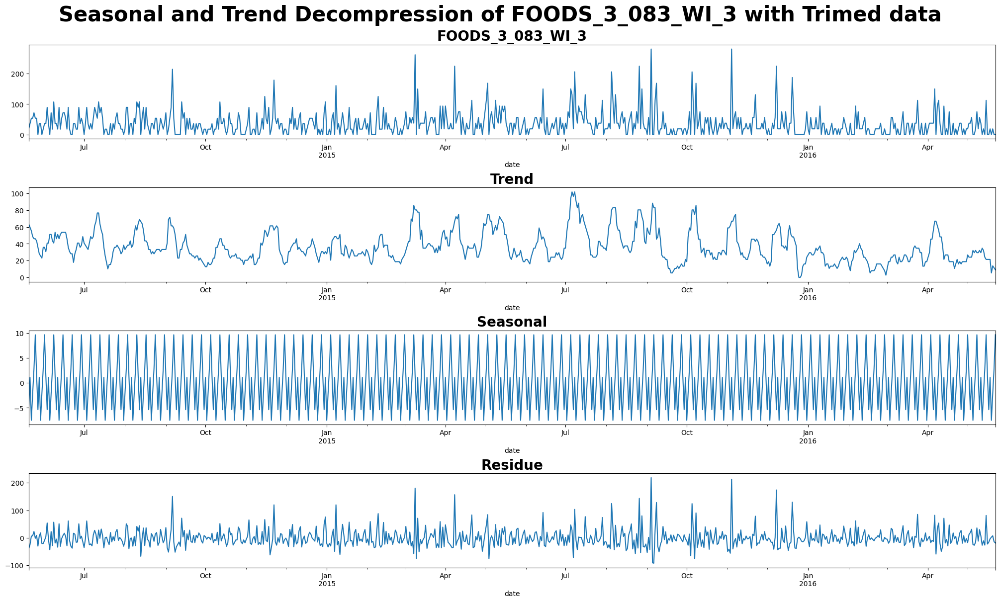

In [29]:
from statsmodels.tsa.seasonal import seasonal_decompose 
decom = seasonal_decompose(single_df_review_ARIMA, model="additive", extrapolate_trend="freq")

fig,ax =  plt.subplots(nrows= 4, ncols=1, figsize = ( 20, 12), constrained_layout=True) 

fig.suptitle('Seasonal and Trend Decompression of FOODS_3_083_WI_3 with Trimed data', fontsize = 30, weight = 'bold')

single_data = decom.observed.plot(ax = ax[0]) 
single_data.set_title('FOODS_3_083_WI_3', size = 20, weight = 'bold')
single_data_trend = decom.trend.plot(ax = ax[1]) 
single_data_trend.set_title('Trend', size = 20, weight = 'bold')
single_data_seasonal = decom.seasonal.plot(ax = ax[2]) 
single_data_seasonal.set_title('Seasonal', size = 20, weight = 'bold')
single_data_resid = decom.resid.plot(ax = ax[3]) 
single_data_resid.set_title('Residue', size = 20, weight = 'bold')

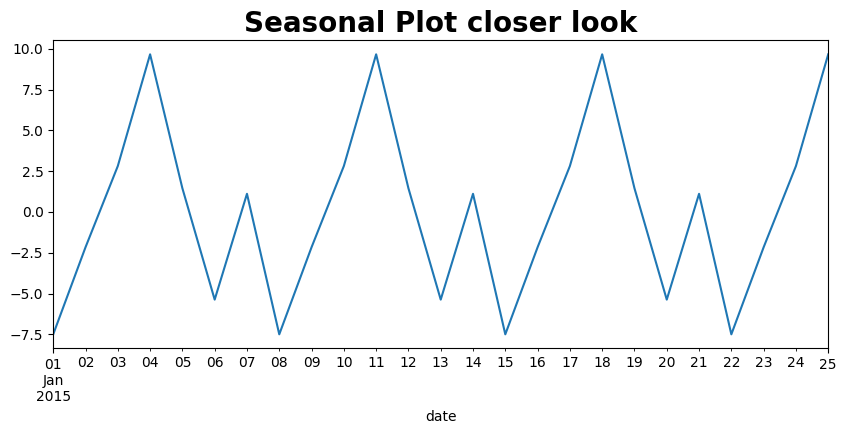

In [30]:
fig,ax =  plt.subplots(figsize = (10, 4)) 
fig = decom.seasonal['2015-01-01':'2015-01-25'].plot()
plt.title("Seasonal Plot closer look", fontsize = 20, weight = 'bold')
plt.show()

## Stationary

In [32]:
from statsmodels.tsa.stattools import adfuller

def test_stationary(table, mean_window, var_window, title):
    
    #Plot rolling statistic:
    dim = (20,5)
    plt.subplots(figsize = dim)
    
    moving_mean = table.rolling(window=mean_window).mean()
    moving_std = table.rolling(window=var_window).std()
    
    original = plt.plot(table, color = 'blue', label = 'Original')
    mean = plt.plot(moving_mean, color = 'red', label = 'Rolling Mean')
    std = plt.plot(moving_std, color = 'black', label = 'Rolling STD')
    plt.legend(loc = 'best')
    plt.title("Rolling mean and STD" + title, fontsize = 20, weight = 'bold')
    plt.show(block = False)
    
    result = adfuller(table, autolag = 'AIC')
    labels = ['ADF Test Static', 'p-value', '# of Legs used', 'Number of Observation Used']
    print('Dickey-Fuller Test: ')
    adf_out = pd.Series(result[0:4], index = labels)
#     for value, label in zip(result,labels):
#         print(label + ': ' + str(value))
       
    
    for key, value in result[4].items():
        adf_out['Critical Value (%s)' %key] = value
    print(adf_out) 
    if(result[1] <= 0.05):
        print('Strong evidence against the null hypothesis Ho, Reject the null hypothesis. Data is stationary')
    else:
        print('Weak evidence against the null hypothesis. Accept the null hypothesis. Time Series has a unit root, indicating it is non-stationary')    

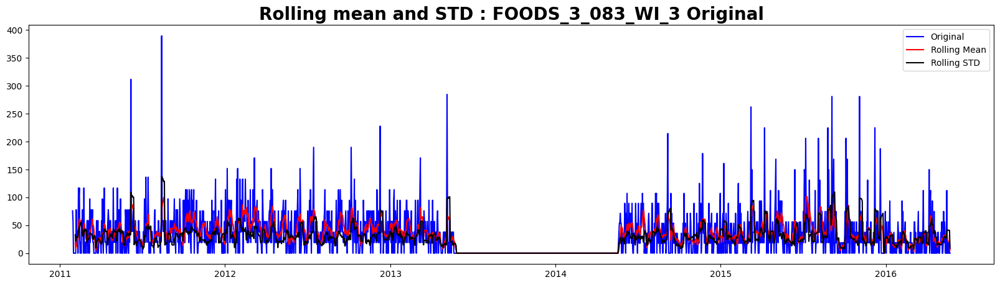

Dickey-Fuller Test: 
ADF Test Static                 -3.621516
p-value                          0.005363
# of Legs used                  26.000000
Number of Observation Used    1914.000000
Critical Value (1%)             -3.433771
Critical Value (5%)             -2.863051
Critical Value (10%)            -2.567575
dtype: float64
Strong evidence against the null hypothesis Ho, Reject the null hypothesis. Data is stationary


In [36]:
#For Rolling statistic, the window will be 7 since this is daily frequency data
test_stationary(single_df, 7, 7, " : FOODS_3_083_WI_3 Original")

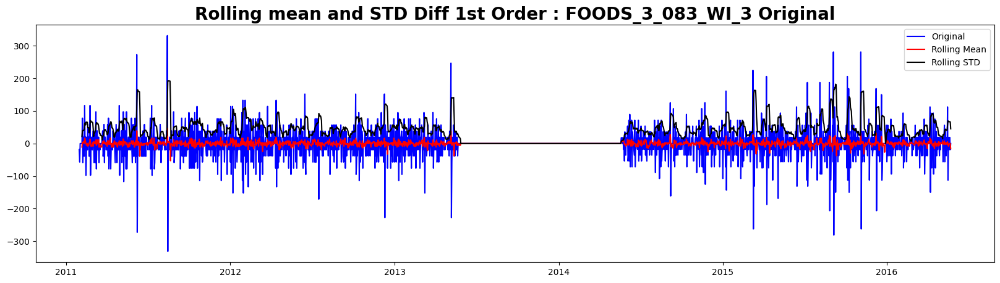

Dickey-Fuller Test: 
ADF Test Static              -1.701619e+01
p-value                       8.521376e-30
# of Legs used                2.600000e+01
Number of Observation Used    1.913000e+03
Critical Value (1%)          -3.433773e+00
Critical Value (5%)          -2.863052e+00
Critical Value (10%)         -2.567575e+00
dtype: float64
Strong evidence against the null hypothesis Ho, Reject the null hypothesis. Data is stationary


In [37]:
#Apply Differential order to the time series and analyze the stationarity characteristics
single_df_diff = single_df - single_df.shift(1)
single_df_diff.dropna(inplace = True)
test_stationary(single_df_diff, 7, 7, " Diff 1st Order : FOODS_3_083_WI_3 Original")

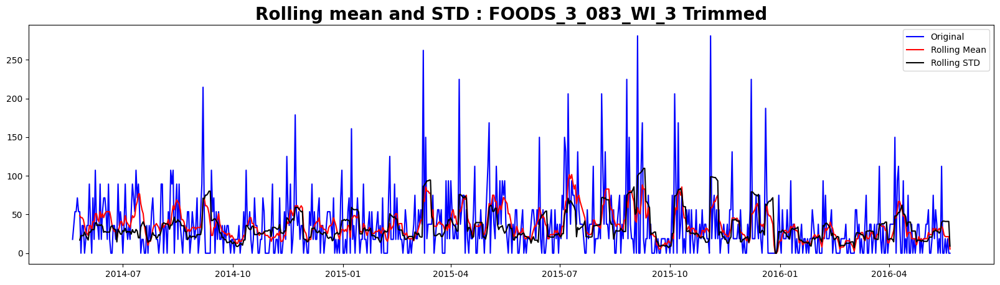

Dickey-Fuller Test: 
ADF Test Static              -8.373310e+00
p-value                       2.626541e-13
# of Legs used                6.000000e+00
Number of Observation Used    7.270000e+02
Critical Value (1%)          -3.439377e+00
Critical Value (5%)          -2.865524e+00
Critical Value (10%)         -2.568891e+00
dtype: float64
Strong evidence against the null hypothesis Ho, Reject the null hypothesis. Data is stationary


In [33]:
#For Rolling statistic, the window will be 7 since this is daily frequency data
test_stationary(single_df_review_ARIMA, 7, 7, " : FOODS_3_083_WI_3 Trimmed")

Stronger stationary was found with differentiate order 2, but lost many peaks

## Autocorrelation of the graph (ACF) and Partial Autocorrelation Function (PACF)

In [44]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm

def acf_pacf_graph(table,title = '', lag_max = 50):

    fig,ax =  plt.subplots(nrows= 2, ncols=1, figsize = ( 10, 5), constrained_layout=True, sharey=True) 
    fig.suptitle('ACF and PACF' + title, fontsize = 20, weight = 'bold')
    
    plot_acf(table, lags=lag_max, ax = ax[0]) 
    ax[0].set_title("ACF", fontsize = 15, weight = 'bold')
    ax[0].set_xlabel("Lag", fontsize=10)
    ax[0].set_ylabel("ACF", fontsize=10)
    plot_pacf(single_df_diff, lags=lag_max, method = "ols", ax = ax[1]) 
    ax[1].set_title('PACF', fontsize = 15, weight = 'bold')
    ax[1].set_xlabel("Lag", fontsize=10)
    ax[1].set_ylabel("PACF", fontsize=10)

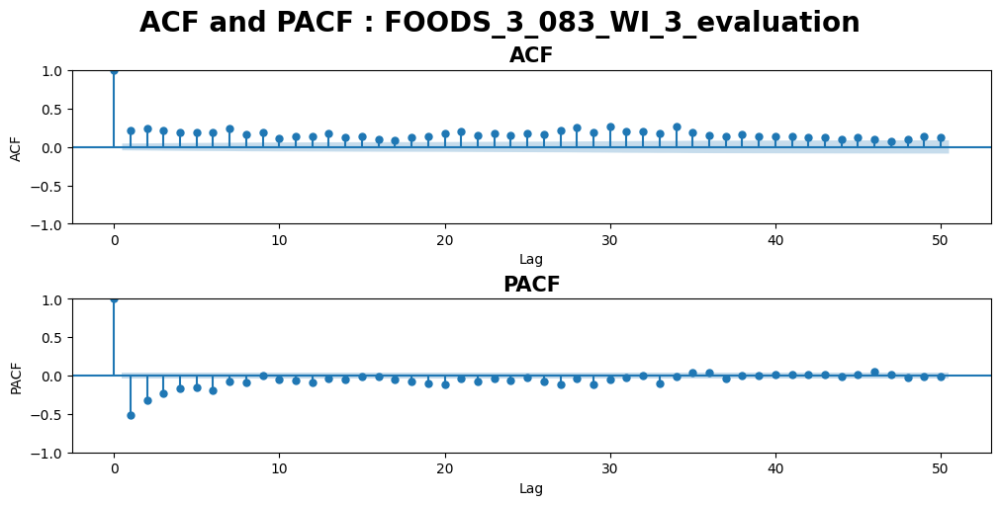

In [48]:
acf_pacf_graph(single_df,' : FOODS_3_083_WI_3_evaluation' )

ACF does not decay as the lag increases, suggesting a trend in the dataset.

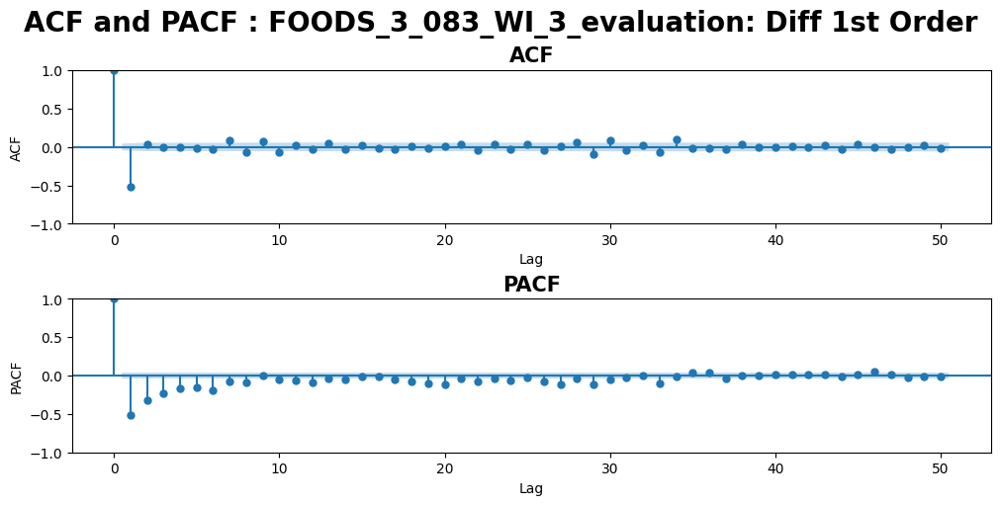

In [50]:
acf_pacf_graph(single_df_diff,' : FOODS_3_083_WI_3_evaluation: Diff 1st Order' )

Parameter p for AR(p) : 1 High negative spike at lag 1\
Parameter q for MA(q) : 0 Geometric decay at PACF \
Difference parameter (d) is set to: 1

After applying first-order differencing, the data became more stationary, with a significantly low p-value of 8.52e-30 and a decay in ACF with higher lags. Nonetheless, notable features emerged, such as a significant negative spike at lag 1 in ACF and negative correlations in PACF. While the last value outside the negative confidence band appears at lag 8, correlations exceeding the negative confidence band are present with other lags. For simplicity, we opt to use an MA model, resulting in ARIMA parameters of (1,1,0).

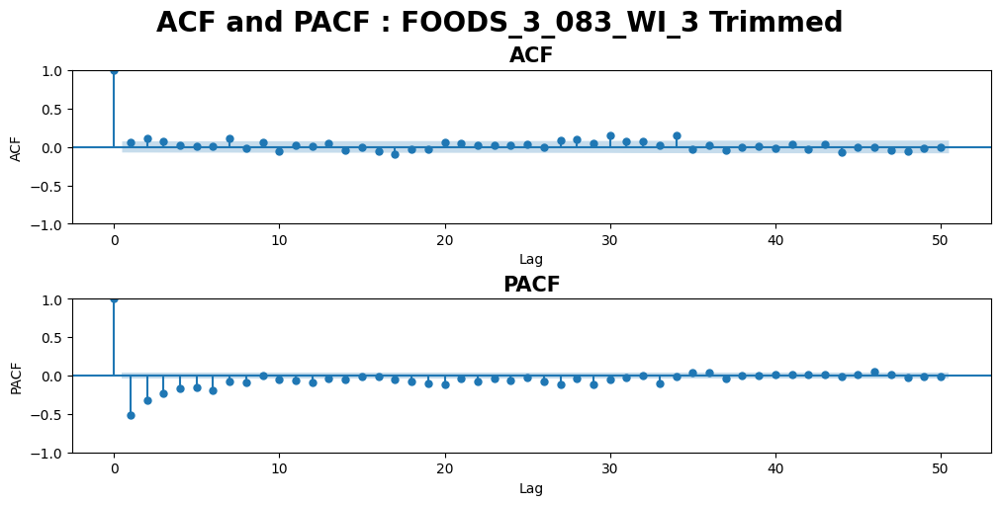

In [45]:
acf_pacf_graph(single_df_review_ARIMA,' : FOODS_3_083_WI_3 Trimmed' )

Parameter p for AR(p) : 0 No significant spike\
Parameter q for MA(q) : 6 a  spike outside at lag 6\
Difference parameter (d) is set to: 0
There were no obvious spikes observed in the ACF plot. However, the PACF plot displayed a significant spike outside the range at lag 6. 

## Split the data into train and test

In [84]:
#Funtion to split train and test table for ARIMA model
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#target: target data
#test_size: testing size (default 30 days)
#max_date: maximum date that you would like to use in the table (default 1941)

#Return
#Y_train: contain train daily_sell data with datetime index with all the days before last 30 days unless threshold are changed
#Y_test: contain test daily_sell dataw ith datetime index with all the days for last 30 days unless threshold are changed

def test_train_split_arima(table, product, target = 'daily_sell', test_size = 30, max_date = 1941):
    Y_train = table.loc[(table['id'] == product) & (table['day'] <= (max_date - test_size)) , ['date',target]].set_index('date')
    Y_test = table.loc[(table['id'] == product) & (table['day'] > (max_date - test_size)) , ['date',target]].set_index('date')
    
    return Y_train, Y_test

In [86]:
#Funtion to split train and test table for SARIMAX model with table with exogenous variable for test and train date range
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#target: target data
#test_size: testing size (default 30 days)
#max_date: maximum date that you would like to use in the table (default 1941)

#Return

#Y_train: contain train daily_sell data with datetime index with all the days before last 30 days unless threshold are changed
#Y_test: contain test daily_sell dataw ith datetime index with all the days for last 30 days unless threshold are changed
#Y_exog_train: table of exogenous variables with training range
#Y_exog_test: table of exogenous variables with testing range
def test_train_split_sarima(table, product, test_size = 30, max_date = 1941):
    
    Y_train = table.loc[(table['id'] == product) & (table['day'] <= (max_date - test_size)), ['date','daily_sell']].set_index('date')
    Y_exog_train = table.loc[(table['id'] == product) & (table['day'] <= (max_date - test_size))].set_index('date')
    Y_test = table.loc[(table['id'] == product) & (table['day'] > (max_date - test_size)), ['date','daily_sell']].set_index('date')
    Y_exog_test = table.loc[(table['id'] == product) & (table['day'] > (max_date - test_size))].set_index('date')
    
    Y_exog_train = Y_exog_train.drop(['id','daily_sell', 'sell_quantity'], axis = 1)
    Y_exog_test = Y_exog_test.drop(['id','daily_sell', 'sell_quantity'], axis = 1)
    
    return Y_train, Y_test, Y_exog_train, Y_exog_test


In [88]:
#Funtion to split train and test table for regression model that also output the table of date (datetime) for training and testing range
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#target: target data
#test_size: testing size (default 30 days)
#max_date: maximum date that you would like to use in the table (default 1941)

#Return
#Y_train: contain train daily_sell data before last 30 days unless threshold are changed
#Y_test: contain test daily_sell data for last 30 days unless threshold are changed
#X_train: contain all the table except ''id','daily_sell','sell_quantity', and 'date'before last 30 days unless threshold are changed
#X_test: c contain all the table except ''id','daily_sell','sell_quantity', and 'date' last 30 days unless threshold are changed
#Train_date: table of training range
#Test_date: table of testing range

def test_train_split_w_date(table, product, test_size = 30, max_date = 1941):

    X_train = table.loc[(table['id'] == product) & (table['day'] <= (max_date - test_size))].copy()
    X_train['days'] = X_train.loc[:, 'date'].dt.day
    
    Train_date = X_train.loc[:, 'date']
    
    X_train = X_train.drop(['id','daily_sell','sell_quantity', 'date'], axis = 1)
    
    Y_train =  table.loc[(table['id'] == product) & (table['day'] <= (max_date - test_size)), 'daily_sell']
    
    X_test = table.loc[(table['id'] == product) & (table['day'] > (max_date - test_size))].copy()
    X_test['days'] = X_test.loc[:, 'date'].dt.day
    
    Test_date = X_test.loc[:, 'date']
    
    X_test = X_test.drop(['id','daily_sell','sell_quantity', 'date'], axis = 1)
    
    Y_test = table.loc[(table['id'] == product) & (table['day'] > (max_date - test_size)), 'daily_sell']

    return Y_train, X_train, Y_test, X_test, Train_date, Test_date

## Evaluating table and functions

In [91]:
#Function to calculate MAPE
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#product_col: column name for product id (default 'id')
#ape_col: column name for ape for that product (default 'ape')
#mape_col: column name for mape for that product (default 'mape')

#Write MAPE into specified produuct id 
def MAPE(table, product, product_col = 'id', ape_col = 'ape', mape_col = 'mape'):
    #Calculate MAPE from APE values
    table.loc[(table[product_col] == product), mape_col]= table.loc[table[product_col] == product, ape_col].mean()

In [93]:
#Function to calculate MAPE
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#r2_col: column name for r2 (default 'r2')
#product_col: column name for product id (default 'id')
#Y_actual_col: column name for actual for that product (default 'actual')
#Y_Predicted_col: column name for predicted for that product (default 'predicted')

#Calcualte R2 and write the data into specified produuct id  

def r2(table, product, r2_col = 'r2', product_col = 'id', Y_actual_col ='actual', Y_Predicted_col = 'predicted'):
    
    actual_mean = table.loc[table[product_col] == product, Y_actual_col].mean()
    predict = table.loc[table[product_col] == product, Y_Predicted_col]
    actual = table.loc[table[product_col] == product, Y_actual_col]
    
    SSRegression = ((predict - actual_mean) ** 2).sum()
    SStotal = ((actual - actual_mean) ** 2).sum()
    r_sqr = SSRegression / SStotal
    
    table.loc[table[product_col] == product, r2_col] = r_sqr

In [95]:
#Function to calculate RSME
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#product_col: column name for product id (default 'id')
#Y_actual_col: column name for actual for that product (default 'actual')
#Y_Predicted_col: column name for predicted for that product (default 'predicted')
#model_col: column name for the forecast model name (default 'model')
#rsme_col: column name for RSME (default 'rmse')

#Calcualte RSME and write the data into specified produuct id 

from sklearn.metrics import mean_squared_error

def RSME(table, product, model, product_col = 'id', Y_actual_col ='actual', Y_Predicted_col = 'predicted', model_col = 'model', rsme_col = 'rmse'):
    actual = table.loc[(table[product_col] == product) & (table[model_col] == model), Y_actual_col]
    predict = table.loc[(table[product_col] == product) & (table[model_col] == model), Y_Predicted_col]
    
    mse = mean_squared_error(actual, predict)
    rmse = np.sqrt(mse)
    
    table.loc[((table[product_col] == product) & (table[model_col] == model)), rsme_col] = rmse

In [96]:
#Function to calculate MAPE
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#adj_r2_col: column name for adjust_r2 (default 'adjust_r2')
#r2_col: column name for r2 (default 'r2')
#product_col: column name for product id (default 'id')
#Y_actual_col: column name for actual for that product (default 'actual')
#Y_Predicted_col: column name for predicted for that product (default 'predicted')

#Calcualte Adjusted R2 and write the data into specified produuct id  

def adj_r2(table, product, adj_r2_col = 'adjust_r2', r2_col = 'r2', product_col = 'id', Y_actual_col ='actual', Y_Predicted_col = 'predicted'):
    
    r2 = table.loc[table[product_col] == product, r2_col]
    n = table.loc[table[product_col] == product, r2_col].shape[0]
    #If only daily sales column is in the table and date data is indexed
    if(len(table.columns) == 1):
        p = 1
    else:
        p = len(table.columns) - 1
    adj_rsquared = 1 - (1 - r2) * ((n - 1)/(n-p-1))
    table.loc[table[product_col] == product, adj_r2_col] = adj_rsquared


In [97]:
#Function to calculate MAPE
#Input
#table: dataframe table data that you want to split the data into train and test table
#product: product id
#product_col: column name for product id (default 'id')
#Y_actual_col: column name for actual data (default 'actual')
#Y_Predicted_col: column name for predicted (default 'predicted')
#abs_res: column name for absolute residual (default 'abs_residual')
#ape_col: column name for ape for that product (default 'ape')

#Calcualte Adjusted APE and write the data into specified produuct id  

def APE(table, product, product_col = 'id', Y_actual_col ='actual', Y_Predicted_col = 'predicted', abs_res = 'abs_residual', ape_col = 'ape'):
    
    #To check if there is no zero in the actual value
    if (table.loc[table[product_col] == product, Y_actual_col].eq(0).any() == True):
        #If there is zero, calculate APE with residual instead of actual to avoid result of infinity 
        abs_residual = table.loc[(table[product_col] == product) & (table[Y_actual_col] == 0), abs_res]
        predict_zero = table.loc[(table[product_col] == product) & (table[Y_actual_col] == 0), Y_Predicted_col]
        table.loc[((table[product_col] == product) &(table[Y_actual_col] == 0)), ape_col] = (np.abs(abs_residual - predict_zero)/np.abs(abs_residual))*100
        
        #Calculate APE
        actual = table.loc[(table[product_col] == product) & ~(table[Y_actual_col] == 0), Y_actual_col]
        predict = table.loc[(table[product_col] == product) & ~(table[Y_actual_col] == 0), Y_Predicted_col]
        table.loc[((table[product_col] == product) & ~(table[Y_actual_col] == 0)), ape_col] = (np.abs(actual - predict)/np.abs(actual))*100
        #Create a mask that lists out zero value for actual and predicted values
        mask = (table[product_col] == product) & (table[Y_actual_col] == 0) & (table[Y_Predicted_col] == 0)
        #Change the APE value to 0 on theat mask
        if mask.any():
            table.loc[((table[product_col] == product) & (table[Y_actual_col] == 0) & (table[Y_Predicted_col] == 0)), ape_col] = 0
    else:
        #If there is no zero in the actual result
        actual = table.loc[(table[product_col] == product), Y_actual_col]
        predict = table.loc[(table[product_col] == product), Y_Predicted_col]
        table.loc[(table[product_col] == product), ape_col] = (np.abs(actual - predict)/np.abs(actual))*100

In [101]:
#Function to input all the statical evaluation into input table based on the predicted values
#Input
#table: dataframe table to input the data into
#product: product id (
#predict: predicted data from the forecast model
#ytest: dataframe table for Y_test
#model:  name for forecast model used
#id_col: column name for product id (default 'id')
#date_col: column name for date data  (default 'date')
#Y_actual_col: column name for actual data  (default 'actual')
#Y_Predicted_col: column name for predicted fata (default 'predicted')
#res_col: column name for residual (default 'residual')
#abs_res_col: column name for absolute residual (default 'abs_residual')
#model_col: column name for forecast model name (default 'model')

#Return
#returns table with statically data of 'residual','abs_residual', 'ape','mape', 'rsme', 'r2', 'adjust_r2' based on actual(Y_Test) and predicted data

def evaluation_df_input(table, product, predict, ytest, model, id_col = 'id', date_col = 'date', Y_actual_col ='actual', Y_Predicted_col = 'predicted', res_col = 'residual', abs_res_col = 'abs_residual', model_col = 'model'):
    
    temp_table = ['model','date','id', 'actual', 'predicted', 'residual','abs_residual', 'ape','mape', 'rsme', 'r2', 'adjust_r2']
    predict_dict = {Y_Predicted_col:predict.values.flatten()}
    actual_dict = {Y_actual_col:ytest.values.flatten()}
    date_dict = {date_col:predict.index}
    
    initial_dict = {**actual_dict, **predict_dict}
    temp_table = pd.DataFrame(initial_dict)
    

    temp_table[date_col] = predict.index
    temp_table[id_col] = product
    temp_table[res_col] = temp_table[Y_actual_col] - temp_table[Y_Predicted_col]
    temp_table[abs_res_col] = np.abs(temp_table[res_col])
    temp_table[model_col] = model
    
    #Fill APE calculation
    APE(temp_table, product)
    MAPE(temp_table, product)
    r2(temp_table, product)
    adj_r2(temp_table, product)
    RSME(temp_table, product, model)
    
    if table.empty:
        table = temp_table.copy()
    else:
        table = pd.concat([table,temp_table], ignore_index= True, sort=False)

    return table

## Methodology

### Baseline Modeling

#### Preparation

##### Create evaluating table for the single product

In [68]:
eval_col = ['model','date','id', 'actual', 'predicted', 'residual','abs_residual', 'ape','mape', 'rsme', 'r2', 'adjust_r2']

#Create a table to contain all the statical calculation based on actual and predicted result
eval_df = pd.DataFrame(columns = eval_col)

eval_df['date'] = pd.to_datetime(eval_df['date'])

##### Prepare a table with the data after the large gap observed using the function

In [70]:

product = 'FOODS_3_083_WI_3_evaluation'
sing_df = df.loc[df['id'] == product].copy()
single_df_review = add_gap_indicator(sing_df.copy())

after_gap_day = single_df_review.loc[(single_df_review['id'] == product) & (single_df_review['gap_indicator'] == 3),'day'].tail(1).values[0]
#Creating a table without huge gap
test_df_review = single_df_review.loc[single_df_review['day'] > after_gap_day]

#### ARIMA

##### Using whole data to train the model

In [74]:
y_train_single1, y_test_single1 = test_train_split_arima(test_df,'FOODS_3_083_WI_3_evaluation')

In [75]:
from statsmodels.tsa.arima.model import ARIMA

#Train the model with ARIMA
model1 = ARIMA(endog = y_train_single1, order=(0,1,1), freq = 'D')
#Fit the model
model_fit1 = model1.fit()
#Create the prediction
predict1 = model_fit1.get_forecast(steps=len(y_test_single1))

# summary of fit model
print(model_fit1.summary())
print(model_fit1.resid.describe())

                               SARIMAX Results                                
Dep. Variable:             daily_sell   No. Observations:                 1911
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -9553.875
Date:                Thu, 30 May 2024   AIC                          19111.750
Time:                        03:54:25   BIC                          19122.859
Sample:                    01-29-2011   HQIC                         19115.838
                         - 04-22-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9599      0.007   -137.990      0.000      -0.974      -0.946
sigma2      1293.0926     15.386     84.042      0.000    1262.936    1323.249
Ljung-Box (L1) (Q):                   2.72   Jarque-

C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


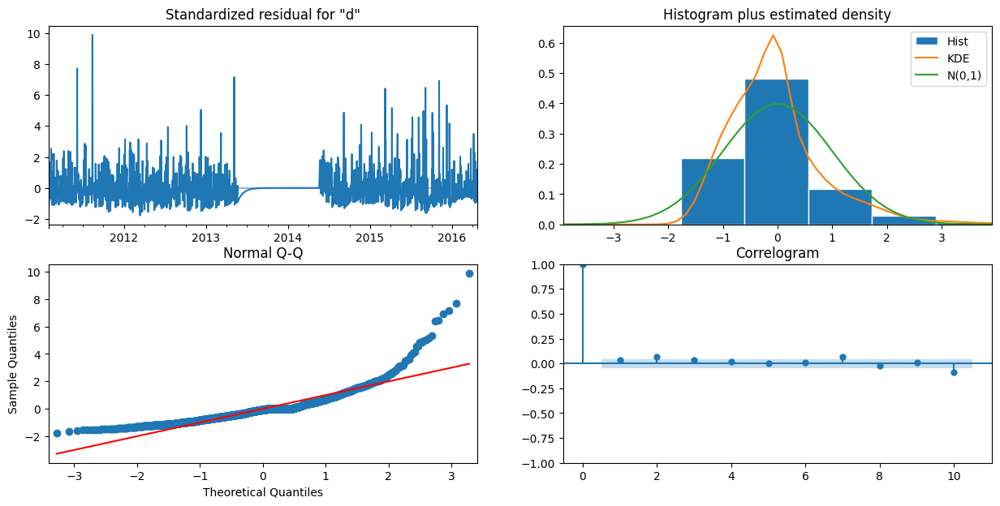

In [76]:
model_fit1.plot_diagnostics(figsize = (15,7))
# model_fit2.plot_diagnostics(figsize = (7,7))
plt.show()

In [77]:
product = 'FOODS_3_083_WI_3_evaluation'
prediction = predict1.predicted_mean.to_frame()
preds1 = prediction.rename(columns={'predicted_mean':'Predictions'})
#Input the predicted values into evaluation table and compute the accuracy
eval_df = evaluation_df_input(eval_df.copy(),product, preds1, y_test_single1, 'ARIMA_011_No_Slice')

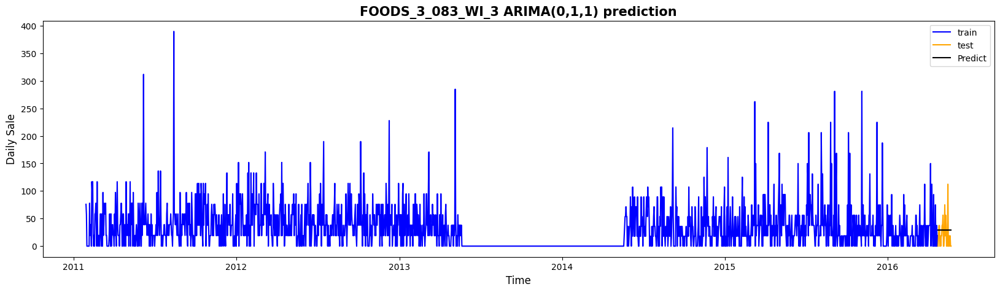

In [78]:
size = (20, 5)
plt.figure(figsize=size)
train = plt.plot(y_train_single1, color = 'blue', label = 'train')
test = plt.plot(y_test_single1, color = 'orange', label = 'test')
predicted = plt.plot(preds1, color = 'black', label = 'Predict')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA(0,1,1) prediction", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

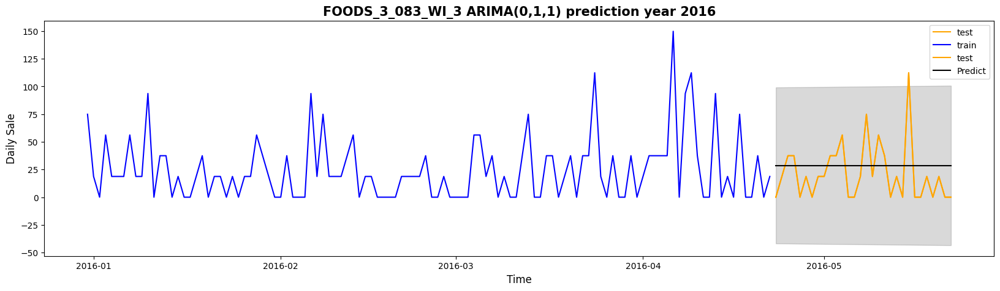

In [79]:
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_single1.loc['2015-12-31':].copy()
predict_limit = preds1.loc['2015-12-31':].copy()
test = plt.plot(y_test_single1, color = 'orange', label = 'test')

plt.plot(y_train_limit, color = 'blue', label = 'train')
plt.plot(y_test_single1['daily_sell'], color = 'orange', label = 'test')
plt.plot(predict_limit, color = 'black', label = 'Predict')

plt.fill_between(y_test_single1.index, 
                 predict1.conf_int().iloc[:, 0], 
                 predict1.conf_int().iloc[:, 1], 
                 color='k', alpha=.15)

plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA(0,1,1) prediction year 2016", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

##### Using data after the large gap to train the model

In [81]:
y_train_single2, y_test_single2 = test_train_split_arima(test_df_review,'FOODS_3_083_WI_3_evaluation')

In [82]:
from statsmodels.tsa.arima.model import ARIMA

model2 = ARIMA(endog = y_train_single2, order=(6,0,0), freq = 'D')

model_fit2 = model2.fit()

predict2 = model_fit2.get_forecast(steps=len(y_test_single2))

# summary of fit model
print(model_fit2.summary())
print(model_fit2.resid.describe())

C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:             daily_sell   No. Observations:                  704
Model:                 ARIMA(6, 0, 0)   Log Likelihood               -3604.262
Date:                Thu, 30 May 2024   AIC                           7224.524
Time:                        03:54:27   BIC                           7260.978
Sample:                    05-20-2014   HQIC                          7238.612
                         - 04-22-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         36.7852      2.850     12.906      0.000      31.199      42.372
ar.L1          0.0433      0.039      1.104      0.269      -0.034       0.120
ar.L2          0.1047      0.035      3.026      0.0

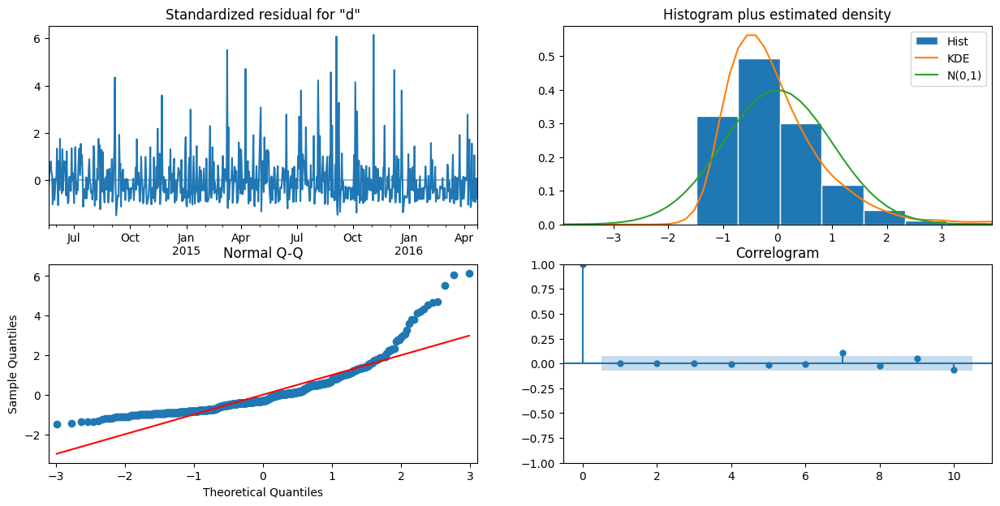

In [83]:
model_fit2.plot_diagnostics(figsize = (15,7))

plt.show()

In [84]:
product = 'FOODS_3_083_WI_3_evaluation'
prediction = predict2.predicted_mean.to_frame()
preds2 = prediction.rename(columns={'predicted_mean':'Predictions'})
#Input the predicted values into evaluation table and compute the accuracy
eval_df = evaluation_df_input(eval_df.copy(),product, preds2, y_test_single2, 'ARIMA_600_Slice')

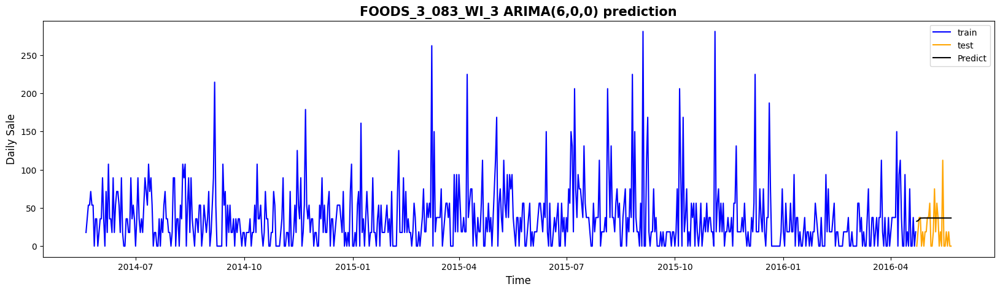

In [85]:
size = (20, 5)
plt.figure(figsize=size)
train = plt.plot(y_train_single2, color = 'blue', label = 'train')
test = plt.plot(y_test_single2, color = 'orange', label = 'test')
predicted = plt.plot(preds2, color = 'black', label = 'Predict')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA(6,0,0) prediction", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

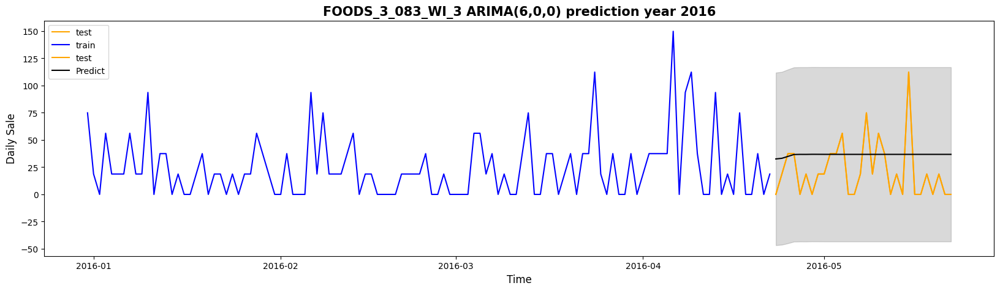

In [86]:
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_single2.loc['2015-12-31':].copy()
predict_limit = preds2.loc['2015-12-31':].copy()
test = plt.plot(y_test_single2, color = 'orange', label = 'test')

plt.plot(y_train_limit, color = 'blue', label = 'train')
plt.plot(y_test_single2['daily_sell'], color = 'orange', label = 'test')
plt.plot(predict_limit, color = 'black', label = 'Predict')

plt.fill_between(y_test_single1.index, 
                 predict2.conf_int().iloc[:, 0], 
                 predict2.conf_int().iloc[:, 1], 
                 color='k', alpha=.15)

plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA(6,0,0) prediction year 2016", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

#### SARIMAX

##### Using a whole data to train the model and apply exogenous variables (same ARIMA(p,d,q) = (0,1,1) )

In [89]:
y_train_SARIMA, y_test_SARIMA, y_exog_train_SARIMA, y_exog_test_SARIMA = test_train_split_sarima(df,'FOODS_3_083_WI_3_evaluation')

In [90]:
y_exog_test_SARIMA.columns

Index(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'wm_yr_wk',
       'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2',
       'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI', 'day', 'is_weekend',
       'month_day', 'week_number', 'events_per_day', 'sell_price', 'lag_1',
       'lag_2', 'lag_3', 'lag_7', 'lag_14', 'lag_21', 'lag_28', 'lag_35',
       'lag_42', 'lag_49', 'rolling_median_7', 'rolling_median_14',
       'rolling_median_28', 'rolling_median_35', 'rolling_median_42',
       'rolling_median_49', 'rolling_median_56', 'rolling_std_7',
       'rolling_std_14', 'rolling_std_28', 'rolling_std_35', 'rolling_std_42',
       'rolling_std_49', 'rolling_std_56'],
      dtype='object')

##### WE will create a model with SARIMAX with exogeneous variables

In [92]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_exog = SARIMAX(endog = y_train_SARIMA.loc[:, 'daily_sell'], order=(0,1,1), exog = y_exog_train_SARIMA, freq = 'D', initialization='approximate_diffuse')
model_exog_fit = model_exog.fit()
predict_exog= model_exog_fit.get_forecast(steps=len(y_test_SARIMA), exog = y_exog_test_SARIMA)

# summary of fit model
print(model_exog_fit.summary())

print(model_exog_fit.resid.describe())

C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:             daily_sell   No. Observations:                 1911
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -11028.219
Date:                Thu, 30 May 2024   AIC                          22152.437
Time:                        03:54:47   BIC                          22419.095
Sample:                    01-29-2011   HQIC                         22250.574
                         - 04-22-2016                                         
Covariance Type:                  opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
item_id              16.5195   1414.059      0.012      0.991   -2754.985    2788.024
dept_id               0.0475      4.069      0.012      0.991      -7.928       8.023
cat_id            -1.616

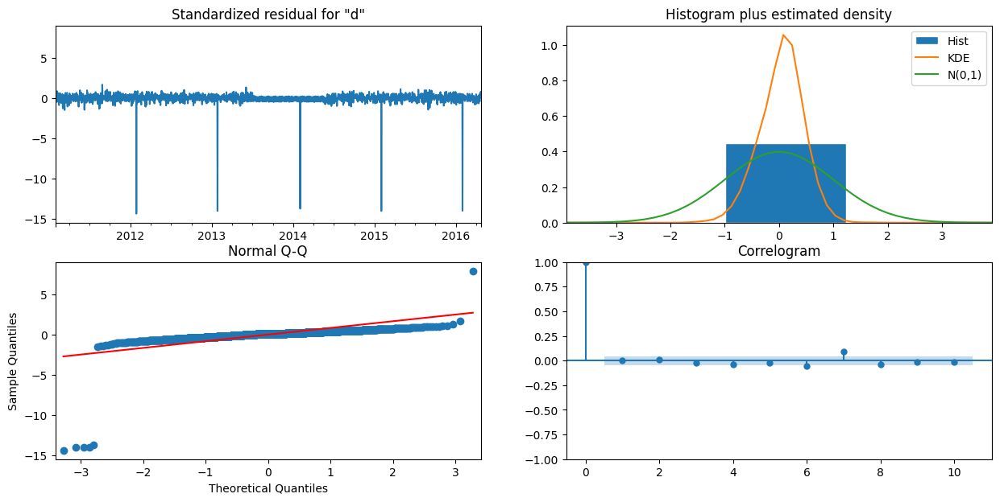

In [93]:
model_exog_fit.plot_diagnostics(figsize = (15,7))

plt.show()

In [94]:
product = 'FOODS_3_083_WI_3_evaluation'
prediction = predict_exog.predicted_mean.to_frame()
preds = prediction.rename(columns={'predicted_mean':'Predictions'})
#Input the predicted values into evaluation table and compute the accuracy
eval_df = evaluation_df_input(eval_df.copy(),product, preds, y_test_SARIMA, 'SARIMA_011')

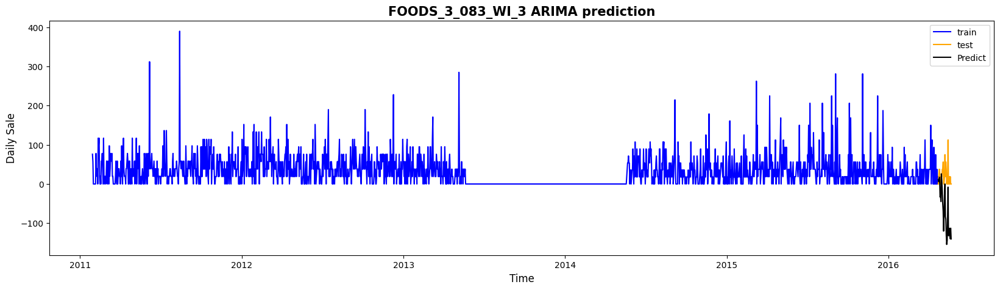

In [95]:
size = (20, 5)
prediction = predict_exog.predicted_mean.to_frame()
plt.figure(figsize=size)
train = plt.plot(y_train_SARIMA, color = 'blue', label = 'train')
test = plt.plot(y_test_SARIMA, color = 'orange', label = 'test')
predicted = plt.plot(prediction, color = 'black', label = 'Predict')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA prediction", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

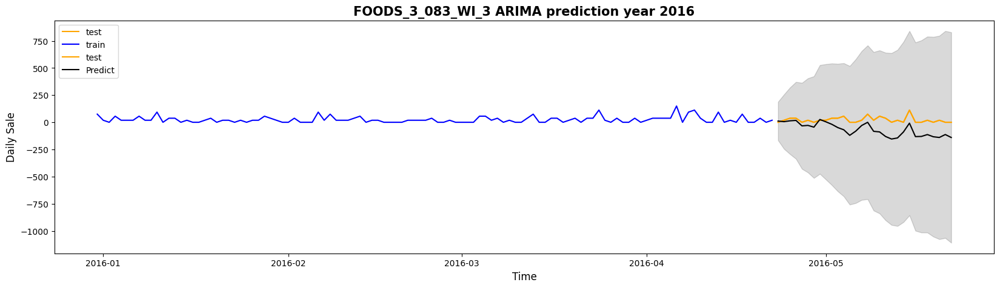

In [96]:
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_SARIMA.loc['2015-12-31':].copy()
predict_limit = preds.loc['2015-12-31':].copy()
test = plt.plot(y_test_SARIMA, color = 'orange', label = 'test')

plt.plot(y_train_limit, color = 'blue', label = 'train')
plt.plot(y_test_SARIMA['daily_sell'], color = 'orange', label = 'test')
plt.plot(predict_limit, color = 'black', label = 'Predict')

plt.fill_between(y_test_SARIMA.index, 
                 predict_exog.conf_int().iloc[:, 0], 
                 predict_exog.conf_int().iloc[:, 1], 
                 color='k', alpha=.15)

plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA prediction year 2016", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

##### Using data after the large gap to train the model and apply exogenous variables (same ARIMA(p,d,q) = (6,0,0))

In [98]:
#Create teh train, test, and exogeneous tables for each train and test range of data
y_train_SARIMA2, y_test_SARIMA2, y_exog_train_SARIMA2, y_exog_test_SARIMA2 = test_train_split_sarima(test_df_review,'FOODS_3_083_WI_3_evaluation')

In [99]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_exog2 = SARIMAX(y_train_SARIMA2['daily_sell'], order=(6,0,0), exog = y_exog_train_SARIMA2, freq = 'D', initialization='approximate_diffuse')
model_exog_fit2 = model_exog2.fit()
predict_exog2 = model_exog_fit2.get_forecast(steps=len(y_test_SARIMA2), exog=y_exog_test_SARIMA2)

# summary of fit model
print(model_exog_fit2.summary())

print(model_exog_fit2.resid.describe())

C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:             daily_sell   No. Observations:                  704
Model:               SARIMAX(6, 0, 0)   Log Likelihood               -3383.536
Date:                Thu, 30 May 2024   AIC                           6875.072
Time:                        03:55:04   BIC                           7121.138
Sample:                    05-20-2014   HQIC                          6970.166
                         - 04-22-2016                                         
Covariance Type:                  opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
item_id             238.5166    401.018      0.595      0.552    -547.465    1024.498
dept_id               0.6864      1.133      0.606      0.545      -1.534       2.907
cat_id             6.443

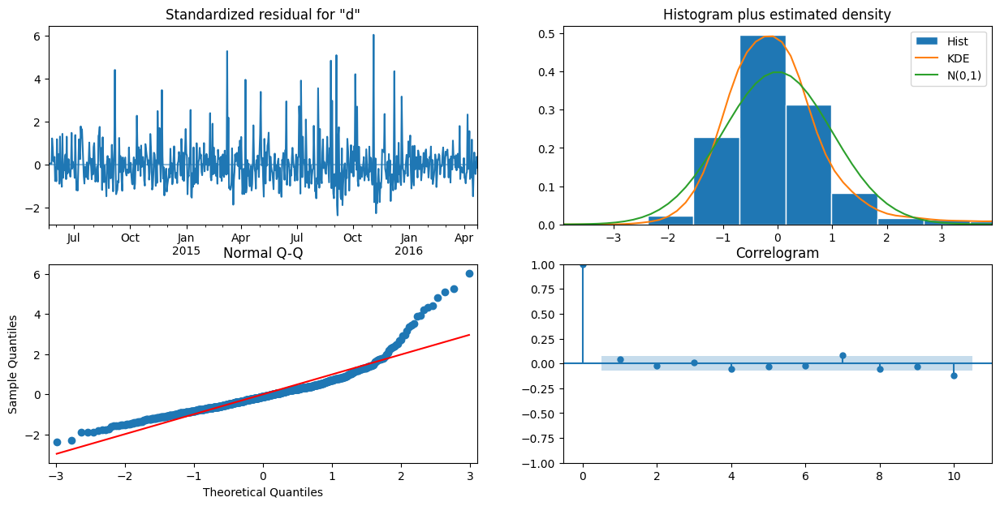

In [100]:
model_exog_fit2.plot_diagnostics(figsize = (15,7))

plt.show()

In [101]:
product = 'FOODS_3_083_WI_3_evaluation'
prediction = predict_exog2.predicted_mean.to_frame()
preds2 = prediction.rename(columns={'predicted_mean':'Predictions'})
#Input the predicted values into evaluation table and compute the accuracy
eval_df = evaluation_df_input(eval_df.copy(),product, preds2, y_test_SARIMA2, 'SARIMA_006_Slice')

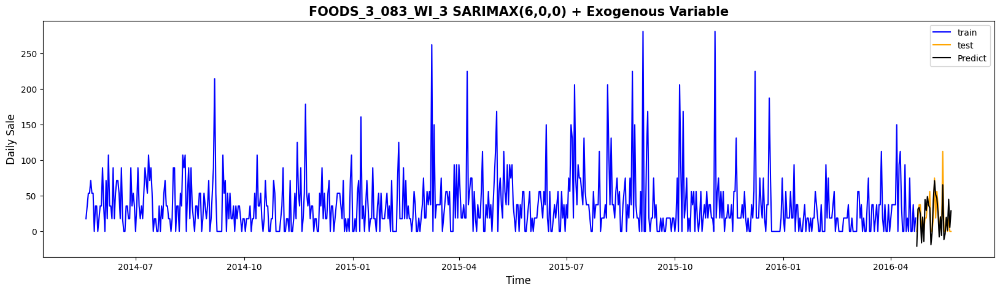

In [102]:
size = (20, 5)
prediction = predict_exog2.predicted_mean.to_frame()
plt.figure(figsize=size)
train = plt.plot(y_train_SARIMA2, color = 'blue', label = 'train')
test = plt.plot(y_test_SARIMA2, color = 'orange', label = 'test')
predicted = plt.plot(prediction, color = 'black', label = 'Predict')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 SARIMAX(6,0,0) + Exogenous Variable", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

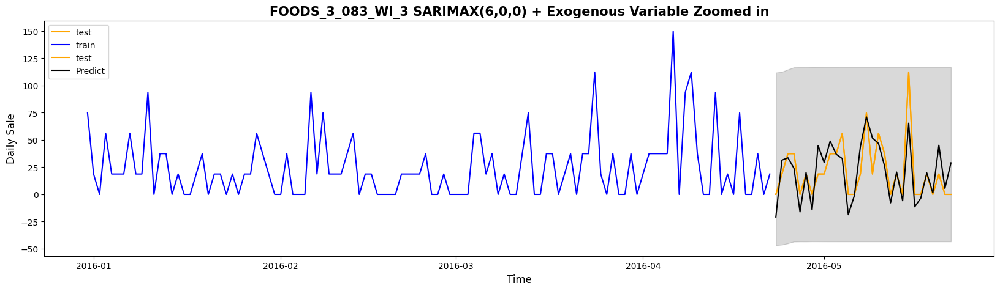

In [103]:
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_SARIMA2.loc['2015-12-31':].copy()
predict_limit = preds2.loc['2015-12-31':].copy()
test = plt.plot(y_test_SARIMA2, color = 'orange', label = 'test')

plt.plot(y_train_limit, color = 'blue', label = 'train')
plt.plot(y_test_SARIMA2['daily_sell'], color = 'orange', label = 'test')
plt.plot(predict_limit, color = 'black', label = 'Predict')

plt.fill_between(y_test_SARIMA2.index, 
                 predict2.conf_int().iloc[:, 0], 
                 predict2.conf_int().iloc[:, 1], 
                 color='k', alpha=.15)

plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 SARIMAX(6,0,0) + Exogenous Variable Zoomed in", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

#### Compare ARIMA models

In [107]:
# Create the time series comparison table for all ARIMA models
test_eval_ARIMA = eval_df.copy()

In [108]:
# Pivot the evaluating table to output just 'mape', 'rmse', 'r2', 'adjust_r2' based on 'id' and 'model'
test_eva = test_eval_ARIMA.pivot_table(index=['id', 'model'], 
                        values=['mape', 'rmse', 'r2', 'adjust_r2'],
                        aggfunc='first').reset_index()

test_eva.sort_values("mape")

,id,model,adjust_r2,mape,r2,rmse
0,FOODS_3_083_WI_3_evaluation,ARIMA_011_No_Slice,-0.351559,27.615579,0.067891,26.951169
1,FOODS_3_083_WI_3_evaluation,ARIMA_600_Slice,0.007167,35.001550,0.315288,29.831409
2,FOODS_3_083_WI_3_evaluation,SARIMA_006_Slice,0.946537,91.708215,0.963129,17.349737
3,FOODS_3_083_WI_3_evaluation,SARIMA_011,23.537154,249.770264,16.542865,103.543732


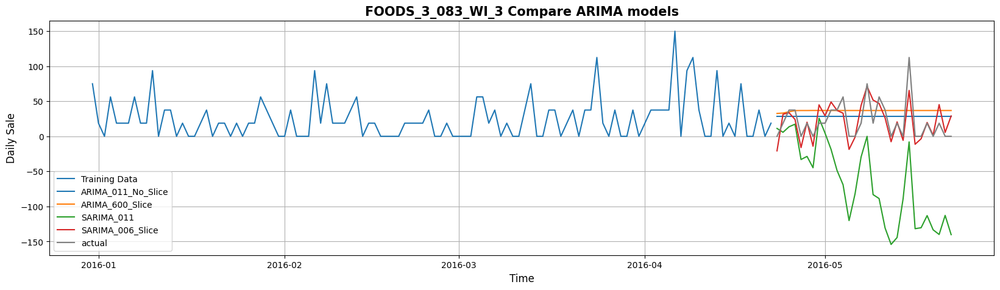

In [109]:
%matplotlib inline
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_SARIMA2.loc['2015-12-31':].copy()
y_train_limit = y_train_limit.reset_index()

sns.lineplot(data = y_train_limit, y = 'daily_sell', x = 'date', label='Training Data')
sns.lineplot(data = test_eval_ARIMA, y = 'predicted', x = 'date', hue = 'model')
sns.lineplot(data = test_eval_ARIMA, y = 'actual', x = 'date', label = 'actual', color = 'gray')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 Compare ARIMA models", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.grid(True)
plt.show()

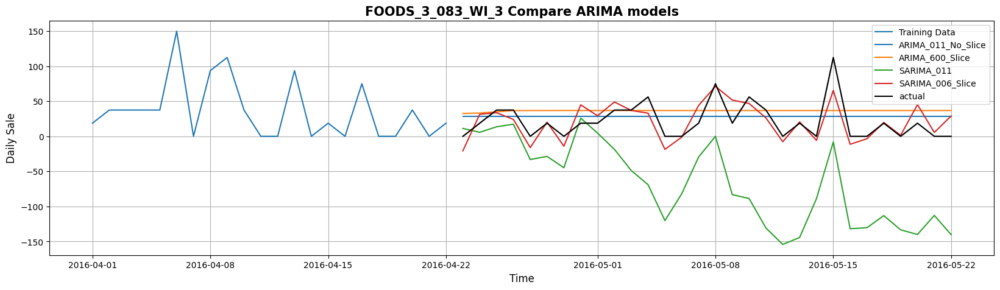

In [110]:
%matplotlib inline
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_SARIMA2.loc['2016-4-01':].copy()
y_train_limit = y_train_limit.reset_index()

sns.lineplot(data = y_train_limit, y = 'daily_sell', x = 'date', label='Training Data')
sns.lineplot(data = test_eval_ARIMA, y = 'predicted', x = 'date', hue = 'model')
sns.lineplot(data = test_eval_ARIMA, y = 'actual', x = 'date', label = 'actual', color = 'black')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 Compare ARIMA models", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.grid(True)
plt.show()

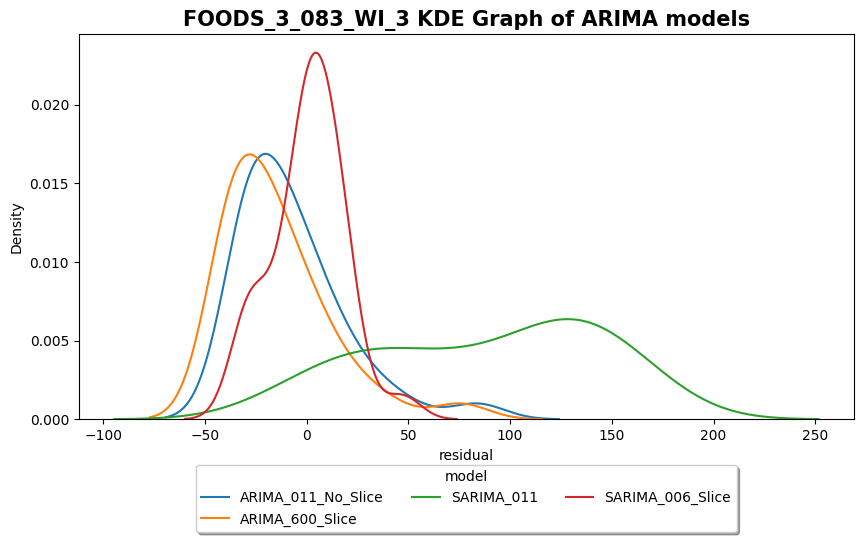

In [111]:
%matplotlib inline
size = (10, 5)
legend = test_eval_ARIMA['model'].unique()
plt.figure(figsize=size)
# sns.displot(data=eval_df ,x = 'residual', hue = 'model', kind = 'kde', label = legend)
for model in legend:
    sns.kdeplot(data=test_eval_ARIMA[test_eval_ARIMA['model'] == model], x='residual', label=model)
    
#Plot Kernel density estimation (KEP) Graph
#Plot Kernel density estimation (KEP) Graph
plt.legend(title = 'model', bbox_to_anchor=(0.5, -0.1), loc='upper center',fancybox=True, shadow=True, ncol=3)
plt.title('FOODS_3_083_WI_3 KDE Graph of ARIMA models', fontsize = 15, weight = 'bold')
plt.show()

SARIMAX with sliced data demonstrated the ability to capture most of the peaks in the testing data, while SARIMAX with the original data exhibited negative trends but managed to capture some peaks. The negative trend observed in the latter case may be attributed to the presence of gaps of zeros in the training data, which increased the difficulty of determining the correct p, d, q values.

Including exogenous variables in SARIMAX models allowed for more data to be provided to the model during training, resulting in higher accuracy compared to ARIMA models. This higher accuracy was also evident in the KDE plot, where SARIMAX with sliced training data showed most of the data closely aligned with the original test values.

### EXTENDED MODELING

#### AutoARIMA

##### AutoARIMA using a whole data to train the model 

In [114]:
y_train_autoarima, y_test_autoarima, y_exog_train_autoarima, y_exog_test_autoarima = test_train_split_sarima(df,'FOODS_3_083_WI_3_evaluation')

In [115]:
# Create the time series comparison table for all ARIMA models
test_eval_AutoARIMA = test_eval_ARIMA.copy()

In [116]:
from pmdarima.arima import auto_arima
start_p, start_q = 0, 0
max_p, max_q = 2, 2
d = 1
start_P, start_Q = 0, 0
max_P, max_Q = 2, 2
D = 1
m = 7 

auto_model3 = auto_arima(y=y_train_autoarima, start_p=start_p, start_q=start_q, max_p=max_p,
                           max_q=max_q, d = d, start_P=start_P, start_Q=start_Q, max_P=max_P,
                           max_Q=max_Q, D=D, m=m, max_order=None,seasonal=True,
                           trace=True, stepwise=True, exogenous = y_exog_train_autoarima)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=21372.869, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=20339.973, Time=0.38 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=0.95 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=20799.259, Time=0.17 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=20088.518, Time=0.75 sec
 ARIMA(1,1,0)(2,1,1)[7]             : AIC=inf, Time=2.33 sec
 ARIMA(1,1,0)(1,1,1)[7]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(2,1,0)[7]             : AIC=20693.048, Time=0.25 sec
 ARIMA(2,1,0)(2,1,0)[7]             : AIC=19860.976, Time=0.85 sec
 ARIMA(2,1,0)(1,1,0)[7]             : AIC=20114.073, Time=0.59 sec
 ARIMA(2,1,0)(2,1,1)[7]             : AIC=inf, Time=3.33 sec
 ARIMA(2,1,0)(1,1,1)[7]             : AIC=inf, Time=1.39 sec
 ARIMA(2,1,1)(2,1,0)[7]             : AIC=inf, Time=2.15 sec
 ARIMA(1,1,1)(2,1,0)[7]             : AIC=inf, Time=1.82 sec
 ARIMA(2,1,0)(2,1,0)[7] intercept   : AIC=19862.976, Time=9.0

In [117]:
print(auto_model3.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                 1911
Model:             SARIMAX(2, 1, 0)x(2, 1, 0, 7)   Log Likelihood               -9925.488
Date:                           Thu, 30 May 2024   AIC                          19860.976
Time:                                   03:55:42   BIC                          19888.732
Sample:                               01-29-2011   HQIC                         19871.193
                                    - 04-22-2016                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6993      0.017    -41.334      0.000      -0.732      -0.666
ar.L2         -0.3371      0.016    -20.435

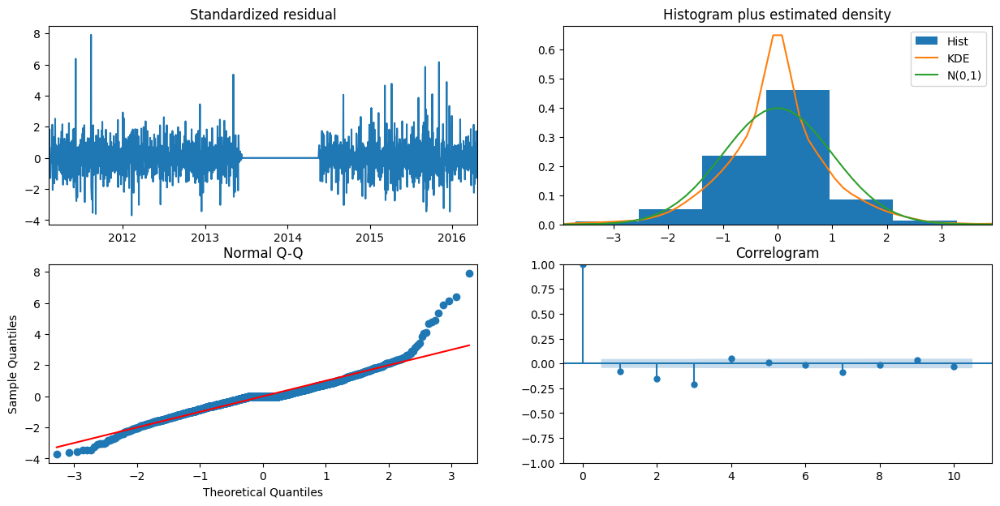

In [118]:
auto_model3.plot_diagnostics(figsize = (15,7))
plt.show()

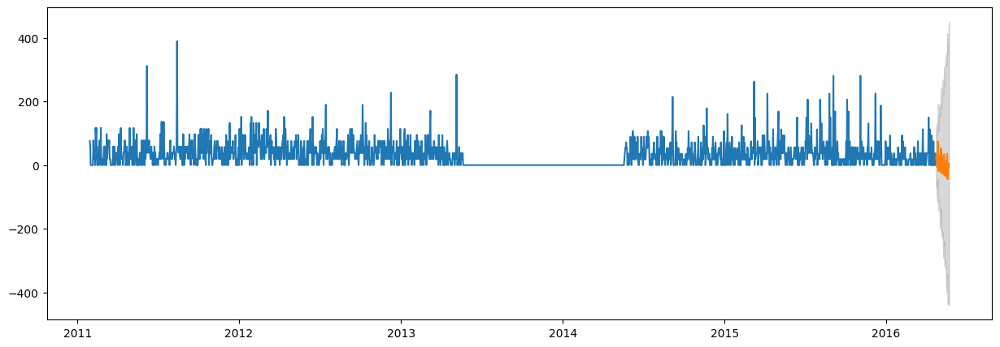

In [119]:
prediction, confint = auto_model3.predict(n_periods=y_test_autoarima.shape[0], return_conf_int=True, exog=y_exog_test_autoarima)

cf= pd.DataFrame(confint)
prediction_series = pd.Series(prediction,index=y_test_autoarima.index)
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.plot(y_train_autoarima)
ax.plot(prediction.to_frame())
ax.fill_between(prediction_series.index,
                cf[0],
                cf[1],color='grey',alpha=.3)

In [120]:
product = 'FOODS_3_083_WI_3_evaluation'
preds2 = pd.DataFrame(prediction, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds2, y_test_autoarima, 'Auto_ARIMA_no_zero_mod')
test_eval_AutoARIMA = evaluation_df_input(test_eval_AutoARIMA.copy(),product, preds2, y_test_autoarima, 'Auto_ARIMA_no_zero_mod')

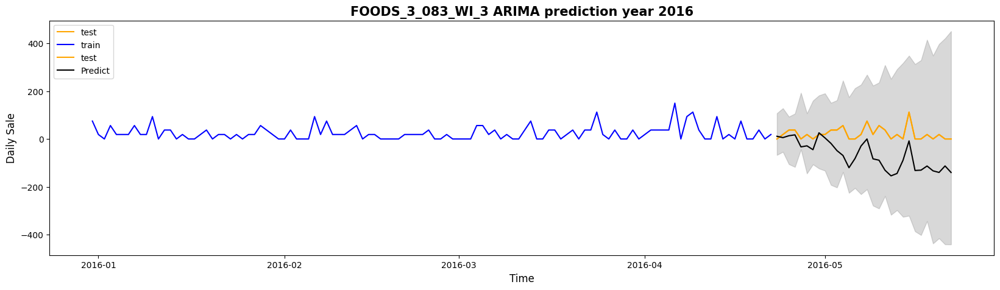

In [121]:
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_autoarima.loc['2015-12-31':].copy()
predict_limit = preds.loc['2015-12-31':].copy()
test = plt.plot(y_test_autoarima, color = 'orange', label = 'test')

plt.plot(y_train_limit, color = 'blue', label = 'train')
plt.plot(y_test_autoarima['daily_sell'], color = 'orange', label = 'test')
plt.plot(predict_limit, color = 'black', label = 'Predict')

plt.fill_between(prediction_series.index,
                cf[0],
                cf[1],color='grey',alpha=.3)

plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 ARIMA prediction year 2016", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

##### AutoARIMA using data after the large gap to train the model

In [123]:
y_train_autoarima2, y_test_autoarima2, y_exog_train_autoarima2, y_exog_test_autoarima2 = test_train_split_sarima(test_df_review,'FOODS_3_083_WI_3_evaluation')

In [124]:
from pmdarima.arima import auto_arima
start_p, start_q = 0, 0
max_p, max_q = 6, 2
d = 1
start_P, start_Q = 0, 0
max_P, max_Q = 2, 2
D = 1
m = 7 

auto_model_zero_mod = auto_arima(y=y_train_autoarima2, start_p=start_p, start_q=start_q, max_p=max_p,
                           max_q=max_q, d = d, start_P=start_P, start_Q=start_Q, max_P=max_P,
                           max_Q=max_Q, D=D, m=m, max_order=None,seasonal=True,
                           trace=True, stepwise=True, exogenous = y_exog_test_autoarima2)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=7979.248, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=7638.085, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=7773.447, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=7540.363, Time=0.33 sec
 ARIMA(1,1,0)(2,1,1)[7]             : AIC=inf, Time=0.94 sec
 ARIMA(1,1,0)(1,1,1)[7]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(2,1,0)[7]             : AIC=7771.674, Time=0.22 sec
 ARIMA(2,1,0)(2,1,0)[7]             : AIC=7458.612, Time=0.34 sec
 ARIMA(2,1,0)(1,1,0)[7]             : AIC=7552.873, Time=0.19 sec
 ARIMA(2,1,0)(2,1,1)[7]             : AIC=inf, Time=1.16 sec
 ARIMA(2,1,0)(1,1,1)[7]             : AIC=inf, Time=0.56 sec
 ARIMA(3,1,0)(2,1,0)[7]             : AIC=7431.342, Time=0.48 sec
 ARIMA(3,1,0)(1,1,0)[7]             : AIC=7529.516, Time=0.24 sec
 ARIMA(3,1,0)(2,1,1)[7]             : AIC=inf, Time=1.62 s

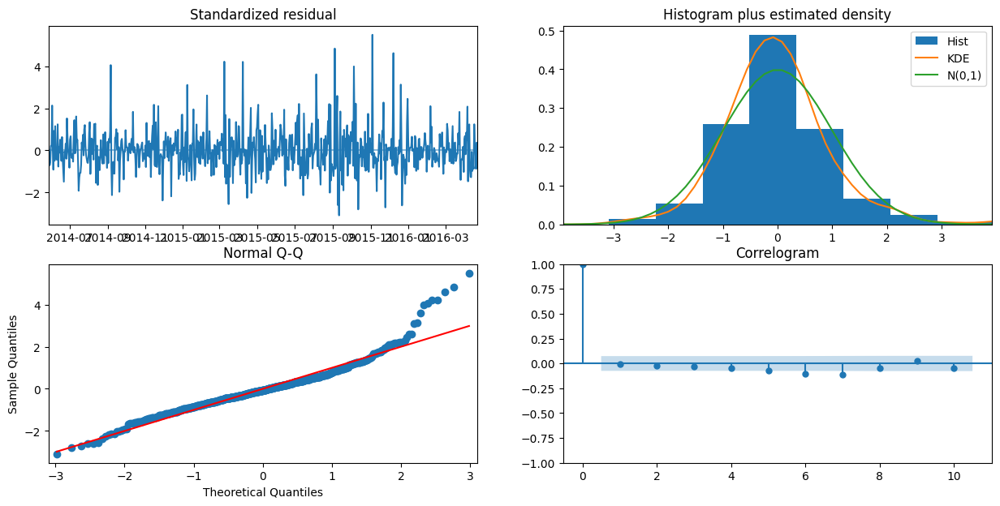

In [125]:
auto_model_zero_mod.plot_diagnostics(figsize = (15,7))
plt.show()

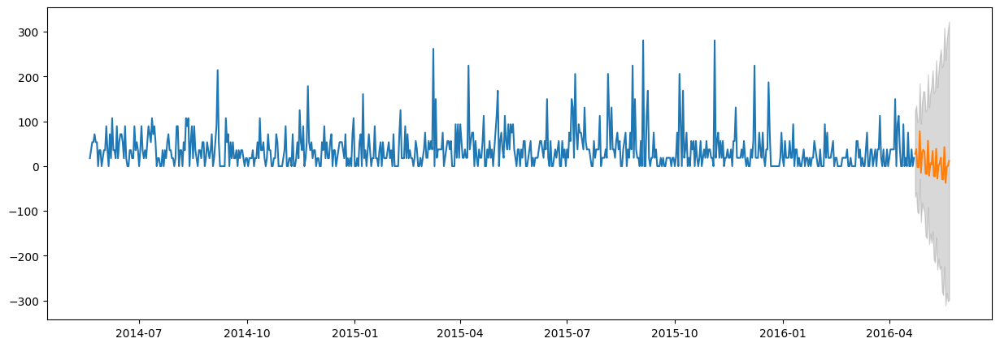

In [126]:
prediction, confint = auto_model_zero_mod.predict(n_periods=y_test_autoarima2.shape[0], return_conf_int=True, exog=y_exog_test_autoarima2)

cf= pd.DataFrame(confint)
prediction_series = pd.Series(prediction,index=y_test_autoarima2.index)
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.plot(y_train_autoarima2)
ax.plot(prediction_series)
ax.fill_between(prediction_series.index,
                cf[0],
                cf[1],color='grey',alpha=.3)

In [127]:
product = 'FOODS_3_083_WI_3_evaluation'
preds2 = pd.DataFrame(prediction, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds2, y_test_autoarima2, 'Auto_ARIMA_sliced')
test_eval_AutoARIMA = evaluation_df_input(test_eval_AutoARIMA.copy(),product, preds2, y_test_autoarima2, 'Auto_ARIMA_sliced')


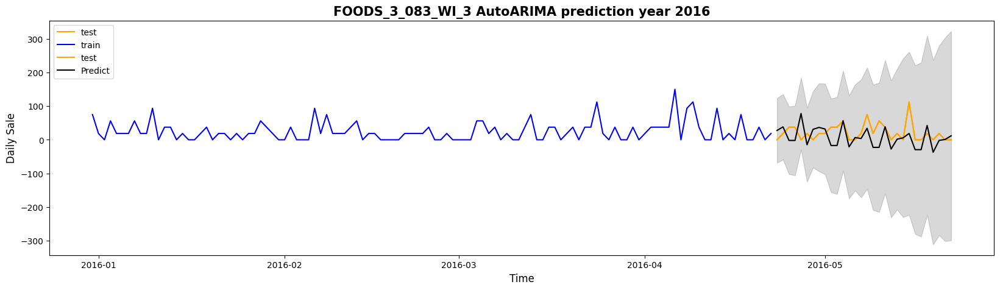

In [128]:
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_autoarima2.loc['2015-12-31':].copy()
predict_limit = preds2.loc['2015-12-31':].copy()
test = plt.plot(y_test_autoarima2, color = 'orange', label = 'test')

plt.plot(y_train_limit, color = 'blue', label = 'train')
plt.plot(y_test_autoarima2['daily_sell'], color = 'orange', label = 'test')
plt.plot(predict_limit, color = 'black', label = 'Predict')

plt.fill_between(prediction_series.index,
                cf[0],
                cf[1],color='grey',alpha=.3)

plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 AutoARIMA prediction year 2016", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.show()

#### Compare ARIMA and AutoARIMA Results

In [129]:
# Pivot the evaluating table to output just 'mape', 'rmse', 'r2', 'adjust_r2' based on 'id' and 'model'
test_eva = test_eval_AutoARIMA.pivot_table(index=['id', 'model'], 
                        values=['mape', 'rmse', 'r2', 'adjust_r2'],
                        aggfunc='first').reset_index()

test_eva.sort_values("mape")

,id,model,adjust_r2,mape,r2,rmse
0,FOODS_3_083_WI_3_evaluation,ARIMA_011_No_Slice,-0.351559,27.615579,0.067891,26.951169
1,FOODS_3_083_WI_3_evaluation,ARIMA_600_Slice,0.007167,35.001550,0.315288,29.831409
4,FOODS_3_083_WI_3_evaluation,SARIMA_006_Slice,0.946537,91.708215,0.963129,17.349737
3,FOODS_3_083_WI_3_evaluation,Auto_ARIMA_sliced,1.732753,95.426566,1.505347,37.947214
2,FOODS_3_083_WI_3_evaluation,Auto_ARIMA_no_zero_mod,2.198351,112.572755,1.826449,40.324060
5,FOODS_3_083_WI_3_evaluation,SARIMA_011,23.537154,249.770264,16.542865,103.543732


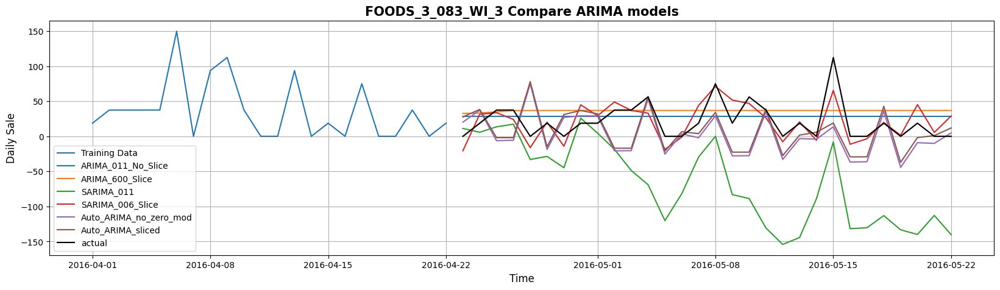

In [130]:
%matplotlib inline
size = (20, 5)
plt.figure(figsize=size)
y_train_limit = y_train_SARIMA2.loc['2016-4-01':].copy()
y_train_limit = y_train_limit.reset_index()
#Plot the train data from y_train_limit that has limit of date to display
sns.lineplot(data = y_train_limit, y = 'daily_sell', x = 'date', label='Training Data')
#Plot all the predicted values from different models and apply legend to distinguish each predicted line
sns.lineplot(data = test_eval_AutoARIMA, y = 'predicted', x = 'date', hue = 'model')
#Plot the actual data
sns.lineplot(data = test_eval_AutoARIMA, y = 'actual', x = 'date', label = 'actual', color = 'black')
plt.legend(loc = 'best')
plt.title("FOODS_3_083_WI_3 Compare ARIMA models", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.grid(True)
plt.show()

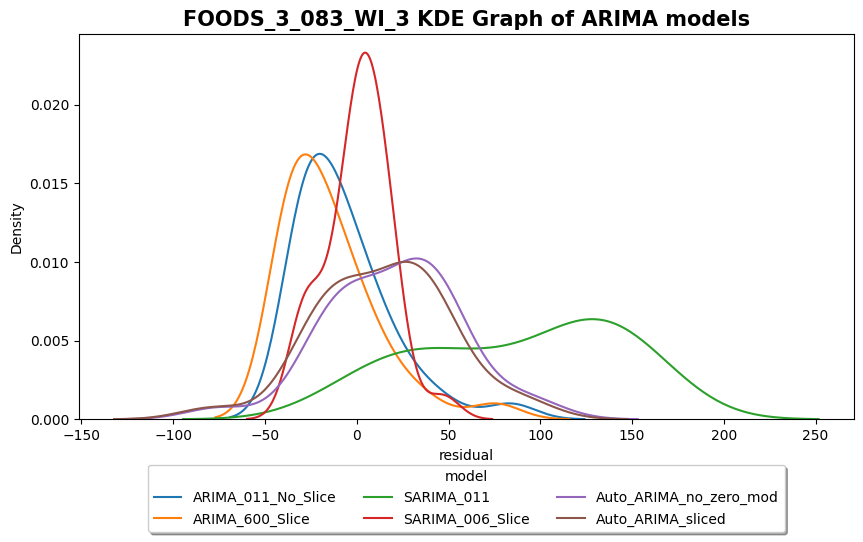

In [131]:
%matplotlib inline
size = (10, 5)
#list all the model name shown in the table 
legend = test_eval_AutoARIMA['model'].unique()
plt.figure(figsize=size)
#plot each KDE graph for each model
for model in legend:
    sns.kdeplot(data=test_eval_AutoARIMA[test_eval_AutoARIMA['model'] == model], x='residual', label=model)
    
#Plot Kernel density estimation (KEP) Graphh
plt.legend(title = 'model', bbox_to_anchor=(0.5, -0.1), loc='upper center',fancybox=True, shadow=True, ncol=3)
plt.title('FOODS_3_083_WI_3 KDE Graph of ARIMA models', fontsize = 15, weight = 'bold')
plt.show()

#### Using Regression models

In [133]:
y_train, x_train, y_test, x_test, train_date, test_date = test_train_split_w_date(test_df_review.copy(),'FOODS_3_083_WI_3_evaluation')

In [134]:
x_train.columns

Index(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'wm_yr_wk',
       'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2',
       'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI', 'day', 'is_weekend',
       'month_day', 'week_number', 'events_per_day', 'sell_price', 'lag_1',
       'lag_2', 'lag_3', 'lag_7', 'lag_14', 'lag_21', 'lag_28', 'lag_35',
       'lag_42', 'lag_49', 'rolling_median_7', 'rolling_median_14',
       'rolling_median_28', 'rolling_median_35', 'rolling_median_42',
       'rolling_median_49', 'rolling_median_56', 'rolling_std_7',
       'rolling_std_14', 'rolling_std_28', 'rolling_std_35', 'rolling_std_42',
       'rolling_std_49', 'rolling_std_56', 'gap_indicator', 'days'],
      dtype='object')

#### Linear Regression

In [136]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train, y_train)
pred =lr.predict(x_test)  




In [138]:
preds = pd.DataFrame(pred, index=test_date, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds, y_test, 'Linear_Regression')

### Decision Tree

In [141]:
from sklearn.tree import DecisionTreeRegressor
tree_model = DecisionTreeRegressor()

dt = tree_model.fit(x_train, y_train)
y_pred_tree=dt.predict(x_test)

preds = pd.DataFrame(y_pred_tree, index=test_date, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds, y_test, 'Decision_Tree_Regression')

#### Hyperparameter Tuning Decision Tree

In [143]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'max_depth': [3, 4, 5, 6, None],
    'min_samples_split': [2, 3, 5, 6, 7],
    'min_samples_leaf': [1, 2, 3],
    'max_features': [0.1, 'sqrt', 'log2', None]
}

# Initialize the decision tree classifier
dt_regressor = DecisionTreeRegressor()

# Perform grid search using cross-validation
grid_search = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


Best Parameters: {'max_depth': 4, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 6}


In [145]:
# Evaluate the best model on the test set
best_model = grid_search.best_estimator_


y_pred = best_model.predict(x_test)

preds = pd.DataFrame(y_pred, index=test_date, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds, y_test, 'DecisionTree_Tuned')


#### XGBoost Regressor

In [147]:
from xgboost import XGBRegressor

model =XGBRegressor()

xgb = model.fit(x_train, y_train)
y_pred_xgb=xgb.predict(x_test)


preds = pd.DataFrame(y_pred_xgb, index=test_date, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds, y_test, 'XGBRegressor')

#### Hyperparameter Tuning XGBoost Regressor

In [2210]:
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 300, 500, 800],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.5, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.2],
    'reg_lambda': [0, 0.2]    
}

# Initialize the XGBoost Regressor
xgb = XGBRegressor()

# Initialize Grid Search
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error', 
                           verbose=2, n_jobs=-1)

# Fit the Grid Search to the training data
grid_search.fit(x_train, y_train)

# Access the best parameters and estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best Parameters:", best_params)

# Make predictions and evaluate the model
y_pred = best_estimator.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Fitting 5 folds for each of 2916 candidates, totalling 14580 fits
Best Parameters: {'colsample_bytree': 1.0, 'gamma': 0.2, 'learning_rate': 0.01, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 300, 'subsample': 0.8}
Mean Squared Error: 266.6282602645744


In [148]:
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor
# Define the parameter grid
param_grid = {
    'n_estimators':  [325, 350, 375],
    'max_depth': [7,9],
    'learning_rate': [0.01, 0.5],
    'min_child_weight': [1,2],
    'gamma': [0.15, 0.2,0.25],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.8, 0.9, 0.95]
}

# Initialize the XGBoost Regressor
xgb = XGBRegressor()

# Initialize Grid Search
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error', 
                           verbose=2, n_jobs=-1)

# Fit the Grid Search to the training data
grid_search.fit(x_train, y_train)

# Access the best parameters and estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best Parameters:", best_params)

# Make predictions and evaluate the model
y_pred = best_estimator.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Fitting 5 folds for each of 648 candidates, totalling 3240 fits
Best Parameters: {'colsample_bytree': 0.9, 'gamma': 0.25, 'learning_rate': 0.01, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 325, 'subsample': 0.9}
Mean Squared Error: 262.8120964672477


In [149]:
# Apply the best parameters to a new XGBoost Regressor
best_xgb = XGBRegressor(**best_params)
best_xgb.fit(x_train, y_train)

# Make predictions and evaluate the model
y_pred = best_xgb.predict(x_test)

preds = pd.DataFrame(y_pred, index=test_date, columns=['Predictions'])
eval_df = evaluation_df_input(eval_df.copy(),product, preds, y_test, 'XGBRegressor_tuned')

#### Supervised Auto-ML

In [151]:
%%time
from supervised.automl import AutoML

automl_perform = AutoML(mode = 'Perform', explain_level = 2)
automl_perform.fit(x_train, y_train)

predictions_perform = automl_perform.predict(x_test)

AutoML directory: AutoML_493
The task is regression with evaluation metric rmse
AutoML will use algorithms: ['Linear', 'Random Forest', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'ensemble']
* Step simple_algorithms will try to check up to 1 model


C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning: overflow encountered in exp


There was an error during 1_Linear training.
Please check AutoML_493\errors.md for details.
* Step default_algorithms will try to check up to 5 models
1_Default_LightGBM rmse 31.62477 trained in 25.52 seconds (1-sample predict time 0.0522 seconds)
2_Default_Xgboost rmse 32.608992 trained in 14.64 seconds (1-sample predict time 0.1006 seconds)
3_Default_CatBoost rmse 32.906645 trained in 4.1 seconds (1-sample predict time 0.0717 seconds)
4_Default_NeuralNetwork rmse 38.485657 trained in 2.82 seconds (1-sample predict time 0.1575 seconds)
5_Default_RandomForest rmse 33.159181 trained in 19.44 seconds (1-sample predict time 0.1925 seconds)
* Step not_so_random will try to check up to 20 models
10_LightGBM rmse 32.059376 trained in 15.42 seconds (1-sample predict time 0.054 seconds)
6_Xgboost rmse 32.384483 trained in 16.33 seconds (1-sample predict time 0.0961 seconds)
14_CatBoost rmse 33.045985 trained in 10.64 seconds (1-sample predict time 0.0734 seconds)
18_RandomForest rmse 33.514857

2024-05-30 04:12:23,234 supervised.utils.additional_metrics ERROR Exception while saving SHAP importance. [Errno 13] Permission denied: 'AutoML_493\\47_Xgboost\\learner_fold_3_shap_importance.csv'
Continuing ...


48_Xgboost_SelectedFeatures rmse 32.057437 trained in 13.28 seconds (1-sample predict time 0.0786 seconds)
49_Xgboost_SelectedFeatures rmse 32.220567 trained in 13.16 seconds (1-sample predict time 0.0701 seconds)
50_CatBoost_SelectedFeatures rmse 32.665462 trained in 4.44 seconds (1-sample predict time 0.0441 seconds)
51_CatBoost_SelectedFeatures rmse 33.01054 trained in 5.26 seconds (1-sample predict time 0.0656 seconds)
52_RandomForest_SelectedFeatures rmse 32.270464 trained in 14.91 seconds (1-sample predict time 0.1635 seconds)
53_RandomForest_SelectedFeatures rmse 32.350568 trained in 15.81 seconds (1-sample predict time 0.2342 seconds)
54_RandomForest_SelectedFeatures rmse 32.872656 trained in 15.66 seconds (1-sample predict time 0.1865 seconds)
55_RandomForest_SelectedFeatures rmse 32.55021 trained in 16.89 seconds (1-sample predict time 0.1629 seconds)
56_NeuralNetwork_SelectedFeatures rmse 36.990207 trained in 3.64 seconds (1-sample predict time 0.0937 seconds)
57_NeuralNetwo

In [154]:
automl_perform.get_leaderboard().sort_values("metric_value")

,name,model_type,metric_type,metric_value,train_time,single_prediction_time
28,12_LightGBM_RandomFeature,LightGBM,rmse,30.247796,9.15,0.0560
68,Ensemble,Ensemble,rmse,30.527359,2.29,0.4338
15,12_LightGBM,LightGBM,rmse,30.652571,19.37,0.0510
34,26_LightGBM,LightGBM,rmse,30.652571,20.22,0.0556
50,42_LightGBM,LightGBM,rmse,30.675910,20.18,0.0556
...,...,...,...,...,...,...
9,22_NeuralNetwork,Neural Network,rmse,39.455583,3.85,0.1670
14,23_NeuralNetwork,Neural Network,rmse,40.387608,4.09,0.1522
49,41_NeuralNetwork,Neural Network,rmse,40.579153,5.68,0.1910
66,58_NeuralNetwork,Neural Network,rmse,42.736069,5.04,0.1505


In [155]:
product = 'FOODS_3_083_WI_3_evaluation'
preds_perform = pd.DataFrame(predictions_perform,index=test_date, columns=['Predictions'])
best_model_perform= automl_perform.get_leaderboard().sort_values("metric_value")['name'].iloc[0]
automl_bestmodel_perform = "Supervised_Auto_ML_Perform_" + best_model_perform
eval_df = evaluation_df_input(eval_df.copy(),product, preds_perform, y_test, automl_bestmodel_perform)

In [159]:
%%time
from sklearn.model_selection import train_test_split
from supervised.automl import AutoML

automl_explain = AutoML(mode = 'Explain')
automl_explain.fit(x_train, y_train)

predictions_explain = automl_explain.predict(x_test)

AutoML directory: AutoML_494
The task is regression with evaluation metric rmse
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline rmse 36.516156 trained in 0.73 seconds
2_DecisionTree rmse 33.214569 trained in 2.85 seconds
3_Linear rmse 29.293223 trained in 3.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost rmse 28.646477 trained in 3.15 seconds
5_Default_NeuralNetwork rmse 45.252535 trained in 1.03 seconds
6_Default_RandomForest rmse 29.536061 trained in 4.03 seconds
* Step ensemble will try to check up to 1 model
Ensemble rmse 28.007093 trained in 0.19 seconds
AutoML fit time: 21.55 seconds
AutoML best model: Ensemble
CPU times: total: 15.1 s
Wall time: 21.7 s


In [160]:
product = 'FOODS_3_083_WI_3_evaluation'
preds_explain = pd.DataFrame(predictions_explain,index=test_date, columns=['Predictions'])
best_model_explain= automl_explain.get_leaderboard().sort_values("metric_value")['name'].iloc[0]
automl_bestmodel_explain = "Supervised_Auto_ML_Explain_" + best_model_explain
eval_df = evaluation_df_input(eval_df.copy(),product, preds_explain, y_test, automl_bestmodel_explain)

#### H2O AutoML


In [165]:
def test_train_split_h20(table, product, test_size = 30, max_date = 1941):
    
    test_df = table.loc[(table['id'] == product) & (table['day'] > (max_date - test_size))]
    train_df = table.loc[(table['id'] == product) & (table['day'] <= (max_date - test_size))]
    test_df = test_df.drop(['id','sell_quantity'], axis = 1)
    train_df = train_df.drop(['id', 'sell_quantity'], axis = 1)

    y_col = 'daily_sell'
    x_col = train_df.drop('daily_sell', axis = 1).columns.to_list()
    
    return train_df, test_df, x_col, y_col

In [166]:
train_df_h2o, test_df_h2o, x_h20, y_h20 = test_train_split_h20(test_df_review,'FOODS_3_083_WI_3_evaluation')

In [192]:
%%time
import h2o
from h2o.automl import H2OAutoML

h2o.init()

train_h2o = h2o.H2OFrame(train_df_h2o)
test_h2o = h2o.H2OFrame(test_df_h2o)

automl_h20 = H2OAutoML(
    max_runtime_secs=600,   
    max_models=30,           
    stopping_tolerance=0.03, 
    stopping_rounds=3,       
    exclude_algos=['DeepLearning'],     
    seed=10
)

automl_h20.train(x=x_h20, y=y_h20, training_frame=train_h2o)

# Validate the model on the validation data
predictions_h2o = automl_h20.predict(test_h2o)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.411-b09, mixed mode)
  Starting server from C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\yohei\AppData\Local\Temp\tmppt7cv9cd
  JVM stdout: C:\Users\yohei\AppData\Local\Temp\tmppt7cv9cd\h2o_yohei_started_from_python.out
  JVM stderr: C:\Users\yohei\AppData\Local\Temp\tmppt7cv9cd\h2o_yohei_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,01 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.2
H2O_cluster_version_age:,16 days
H2O_cluster_name:,H2O_from_python_yohei_uhhu48
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.034 Gb
H2O_cluster_total_cores:,32
H2O_cluster_allowed_cores:,32
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
04:31:57.29: AutoML: XGBoost is not available; skipping it.
04:31:57.47: _train param, Dropping bad and constant columns: [cat_id, store_id, state_id, dept_id, item_id]


04:31:57.301: _train param, Dropping bad and constant columns: [cat_id, store_id, state_id, dept_id, item_id]


04:31:57.749: _train param, Dropping bad and constant columns: [cat_id, store_id, state_id, dept_id, item_id]

██
04:31:58.488: _train param, Dropping bad and constant columns: [cat_id, store_id, state_id, dept_id, item_id]
04:31:58.729: _train param, Dropping bad and constant columns: [cat_id, store_id, state_id, dept_id, item_id]

█
04:31:59.27: _train param, Dropping bad and constant columns: [cat_id, store_id, state_id, dept_id, item_id]

█
04:31:59.380: _train param, Dropping bad and constant colum

In [193]:

best_model_h20 = automl_h20.leader
best_model_h20_name = best_model_h20.model_id
predictions_h20 = best_model_h20.predict(test_h2o)
predictions__h20_df = h2o.as_list(predictions_h20, use_pandas=True)
lb = h2o.automl.get_leaderboard(automl_h20, extra_columns = "ALL")


gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


C:\Users\yohei\anaconda3\envs\upgraded_py\Lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()



In [194]:
product = 'FOODS_3_083_WI_3_evaluation'
preds_h2o = pd.DataFrame(predictions__h20_df.values,index=test_date, columns=['Predictions'])
best_model_h20_name = best_model_h20.model_id
h20_bestmodel = "H2O_Auto_ML_" + best_model_h20_name
eval_df = evaluation_df_input(eval_df.copy(),product, preds_explain, y_test, h20_bestmodel)

In [195]:
best_model_h20.varimp()

[('gap_indicator', 1614268.0, 1.0, 0.29294156621980555),
 ('rolling_std_7', 1232791.875, 0.7636847630009391, 0.22371501057169613),
 ('lag_1', 265321.90625, 0.16436050658874488, 0.048148024224787596),
 ('lag_3', 256634.25, 0.15897871357172416, 0.046571473349310735),
 ('snap_CA', 237887.71875, 0.14736569067218083, 0.043169536232572046),
 ('lag_35', 226468.59375, 0.14029181879960453, 0.041097305126981315),
 ('rolling_std_35', 162776.53125, 0.10083612587872645, 0.029539092646451597),
 ('rolling_median_7', 161926.828125, 0.1003097553349258, 0.02938489683493866),
 ('lag_2', 147944.359375, 0.09164795397976049, 0.0268474951796717),
 ('rolling_std_42', 125166.453125, 0.0775375917288827, 0.022713983561970737),
 ('rolling_median_14',
  106650.953125,
  0.06606768710338061,
  0.019353971736584364),
 ('rolling_std_14', 106315.4453125, 0.06585984812466084, 0.01929308706063667),
 ('snap_WI', 99401.734375, 0.06157697134242889, 0.018038454428123202),
 ('lag_28', 91836.9765625, 0.05689078676062463, 0.01

In [197]:
product = 'FOODS_3_083_WI_3_evaluation'
preds_explain = pd.DataFrame(predictions_explain,index=test_date, columns=['Predictions'])
best_model_explain= automl_explain.get_leaderboard().sort_values("metric_value")['name'].iloc[0]
automl_bestmodel_explain = "H2O_AutoML_" + best_model_explain
eval_df = evaluation_df_input(eval_df.copy(),product, preds_explain, y_test, automl_bestmodel_explain)

## Result

### Compare all the prediction models

In [199]:
# Pivot the DataFrame to get the desired output
test_eva = eval_df.pivot_table(index=['id', 'model'], 
                        values=['mape', 'rmse', 'r2', 'adjust_r2'],
                        aggfunc='first').reset_index()



In [200]:
test_eva.sort_values("mape")

,id,model,adjust_r2,mape,r2,rmse
5,FOODS_3_083_WI_3_evaluation,Decision_Tree_Regression,0.157929,24.456606,0.419261,22.358307
0,FOODS_3_083_WI_3_evaluation,ARIMA_011_No_Slice,-0.351559,27.615579,0.067891,26.951169
14,FOODS_3_083_WI_3_evaluation,XGBRegressor_tuned,0.194988,30.105138,0.444819,16.211480
4,FOODS_3_083_WI_3_evaluation,DecisionTree_Tuned,0.270323,32.239183,0.496775,16.005696
1,FOODS_3_083_WI_3_evaluation,ARIMA_600_Slice,0.007167,35.001550,0.315288,29.831409
12,FOODS_3_083_WI_3_evaluation,Supervised_Auto_ML_Perform_12_LightGBM_RandomF...,0.192126,37.265888,0.442845,14.494863
6,FOODS_3_083_WI_3_evaluation,H2O_AutoML_Ensemble,0.187311,41.506044,0.439525,15.826093
7,FOODS_3_083_WI_3_evaluation,H2O_Auto_ML_GBM_grid_1_AutoML_1_20240530_43157...,0.187311,41.506044,0.439525,15.826093
11,FOODS_3_083_WI_3_evaluation,Supervised_Auto_ML_Explain_Ensemble,0.187311,41.506044,0.439525,15.826093
13,FOODS_3_083_WI_3_evaluation,XGBRegressor,0.556164,73.397855,0.693906,14.334725


In [201]:
test_eva.sort_values("rmse")

,id,model,adjust_r2,mape,r2,rmse
13,FOODS_3_083_WI_3_evaluation,XGBRegressor,0.556164,73.397855,0.693906,14.334725
12,FOODS_3_083_WI_3_evaluation,Supervised_Auto_ML_Perform_12_LightGBM_RandomF...,0.192126,37.265888,0.442845,14.494863
6,FOODS_3_083_WI_3_evaluation,H2O_AutoML_Ensemble,0.187311,41.506044,0.439525,15.826093
7,FOODS_3_083_WI_3_evaluation,H2O_Auto_ML_GBM_grid_1_AutoML_1_20240530_43157...,0.187311,41.506044,0.439525,15.826093
11,FOODS_3_083_WI_3_evaluation,Supervised_Auto_ML_Explain_Ensemble,0.187311,41.506044,0.439525,15.826093
4,FOODS_3_083_WI_3_evaluation,DecisionTree_Tuned,0.270323,32.239183,0.496775,16.005696
14,FOODS_3_083_WI_3_evaluation,XGBRegressor_tuned,0.194988,30.105138,0.444819,16.211480
8,FOODS_3_083_WI_3_evaluation,Linear_Regression,0.864611,87.044692,0.906629,17.327096
9,FOODS_3_083_WI_3_evaluation,SARIMA_006_Slice,0.946537,91.708215,0.963129,17.349737
5,FOODS_3_083_WI_3_evaluation,Decision_Tree_Regression,0.157929,24.456606,0.419261,22.358307


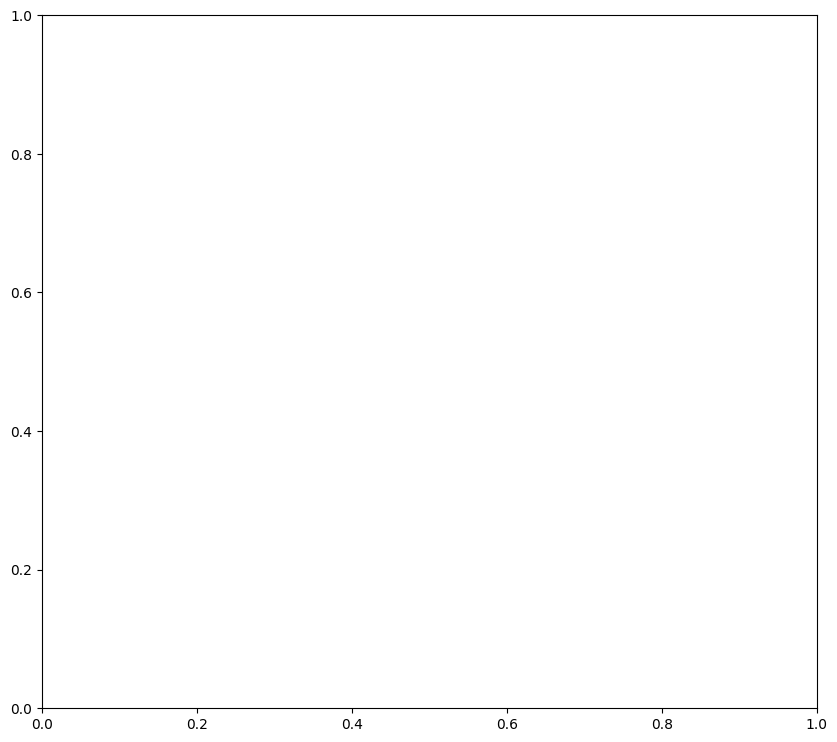

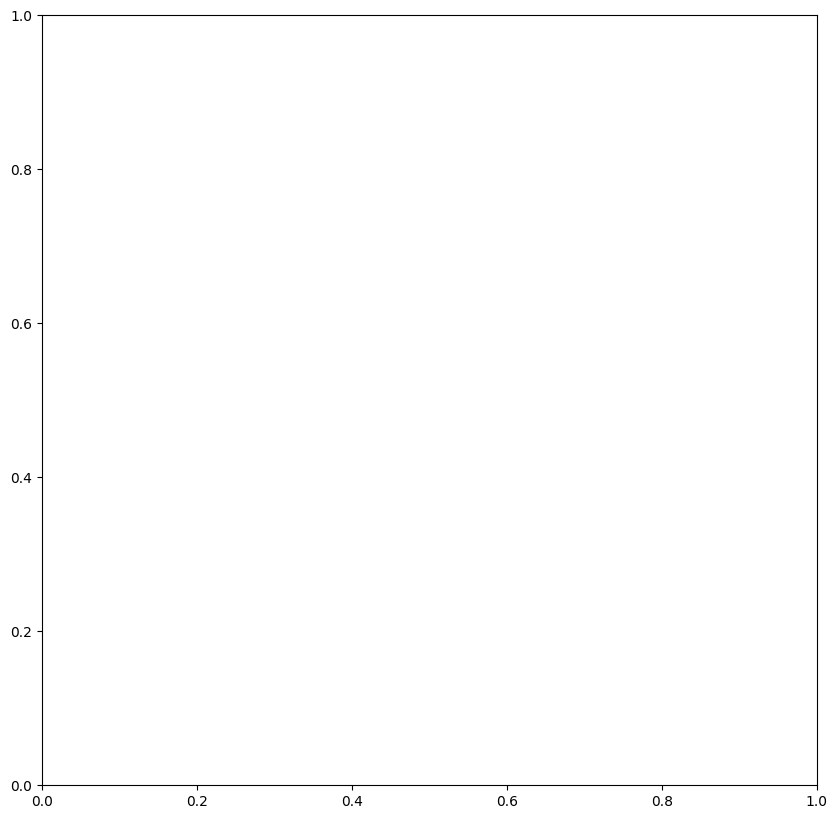

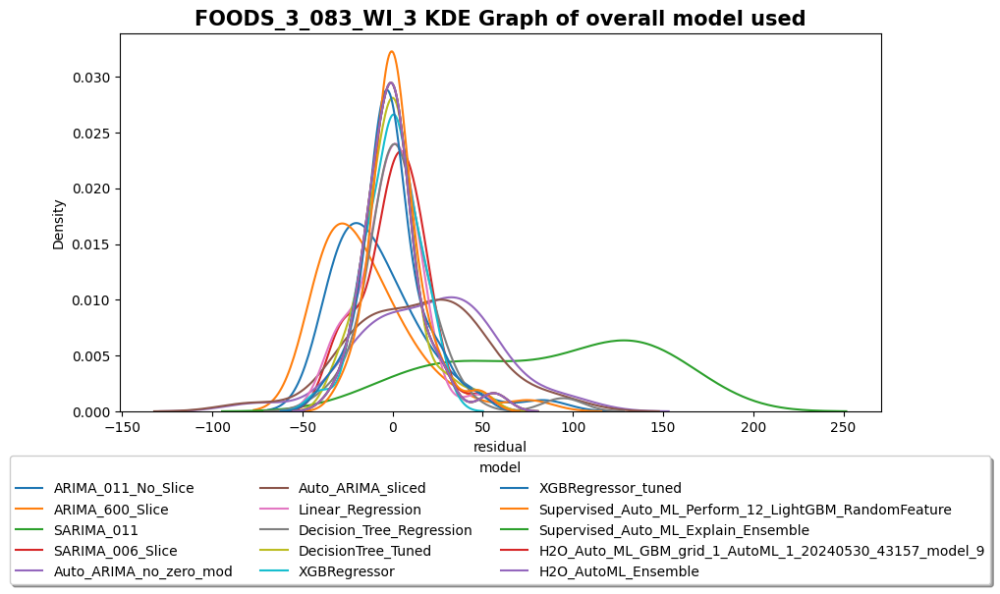

In [202]:
%matplotlib inline
size = (10, 5)
legend = eval_df['model'].unique()
plt.figure(figsize=size)

for model in legend:
    sns.kdeplot(data=eval_df[eval_df['model'] == model], x='residual', label=model)
    
#Plot Kernel density estimation (KEP) Graph
plt.legend(title = 'model', bbox_to_anchor=(0.5, -0.1), loc='upper center',fancybox=True, shadow=True, ncol=3)
plt.title('FOODS_3_083_WI_3 KDE Graph of overall model used', fontsize = 15, weight = 'bold')
plt.show()

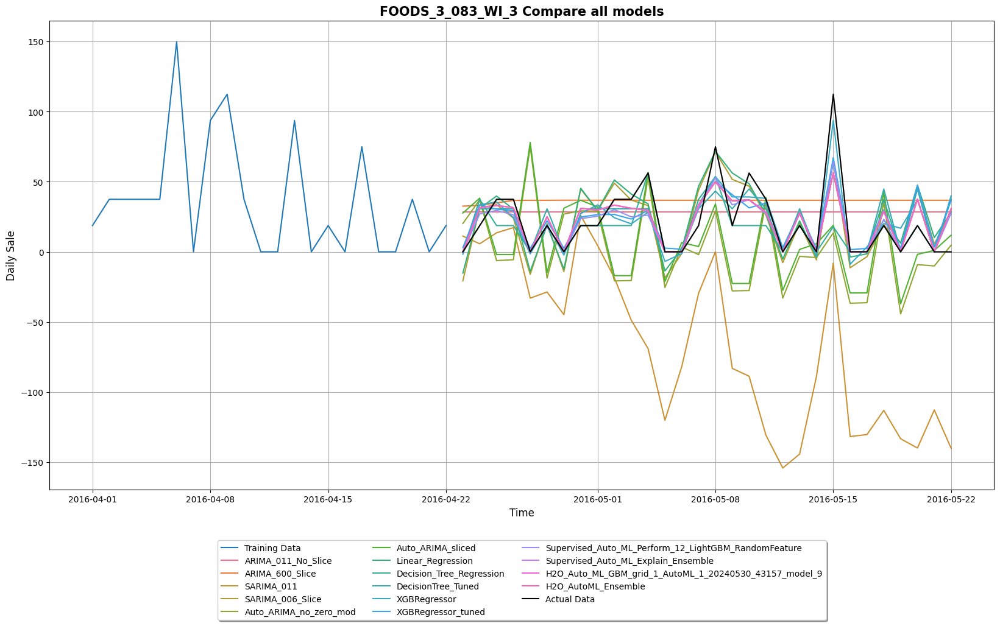

In [205]:
%matplotlib inline
size = (20, 10)
plt.figure(figsize=size)
y_train_limit = y_train_SARIMA2.loc['2016-04-01':].copy()
y_train_limit = y_train_limit.reset_index()

sns.lineplot(data = y_train_limit, y = 'daily_sell', x = 'date', label='Training Data')
sns.lineplot(data = eval_df, y = 'predicted', x = 'date', hue = 'model')
sns.lineplot(data = eval_df, y = 'actual', x = 'date', label = 'Actual Data', color = 'black')

plt.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center',fancybox=True, shadow=True, ncol=3)
plt.title("FOODS_3_083_WI_3 Compare all models", fontsize = 15, weight = 'bold')
plt.ylabel("Daily Sale", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.grid(True)

## With multiple products using AutoML

### Creating the evaluation table for all the products

In [210]:
eval_col = ['model','date','id', 'actual', 'predicted', 'residual','abs_residual', 'ape','mape', 'rsme', 'r2', 'adjust_r2']
eval_df_master = pd.DataFrame(columns = eval_col)

eval_df_master['date'] = pd.to_datetime(eval_df_master['date'])

In [ ]:
eval_col2 = ['model','date','id', 'actual', 'predicted', 'residual','abs_residual', 'ape','mape', 'rsme', 'r2', 'adjust_r2','result_path']
eval_df_master2 = pd.DataFrame(columns = eval_col2)

eval_df_master2['date'] = pd.to_datetime(eval_df_master2['date'])

Add histogram for residual

### Selecting random products

In [ ]:
# Function to select a certain number of product id for each group
def select_random_ids(group, n):
    if len(group) >= n:
        return group.sample(n)
    else:
        return group.sample(n, replace=True) 

# Specify the number of product id for department id and store id
n_random_ids = 1

# Group by department id and store id, then apply the select_random_ids function
random_ids = df.groupby(['dept_id', 'store_id']).apply(lambda x: select_random_ids(x, n_random_ids))

random_ids = random_ids.reset_index(drop=True)

In [ ]:
random_id = random_ids['id'].unique()


In [ ]:
len(random_id)

In [ ]:
from supervised.automl import AutoML
from tqdm import tqdm

for product in tqdm(random_id):

    sing_df = df.loc[df['id'] == product].copy()
    single_df_review_df = add_gap_indicator(sing_df)
    
    after_gap_df = single_df_review_df.loc[(single_df_review_df['id'] == product) & (single_df_review_df['gap_indicator'] == 3),'day']

    #Count number of identifier used
    #Create identifier for consecutive zeros 
    single_df_review_df['group'] = (single_df_review_df['gap_indicator'] != single_df_review_df['gap_indicator'].shift()).cumsum()
    #Group the gap_indicator and group then count the size of the each group
    grouped = single_df_review_df.groupby(['gap_indicator', 'group']).size().reset_index(name='size')

    consecutive_run_counts = grouped.groupby('gap_indicator')['group'].count().reset_index(name='count')

    if len(consecutive_run_counts.loc[consecutive_run_counts['gap_indicator'] == 3, 'count']) > 0:
        count_3 = consecutive_run_counts.loc[consecutive_run_counts['gap_indicator'] == 3, 'count'].values[0]
    #Creating a table without huge gap
    if ((len(after_gap_df) > 0) and (count_3 <= 2) and (count_3 > 0)):
        after_gap_day = after_gap_df.tail(1).values[0]
        single_df_review_df = single_df_review_df.loc[single_df_review_df['day'] > after_gap_day].copy()
        y_train, x_train, y_test, x_test, train_date, test_date = test_train_split_w_date(single_df_review_df.copy(), product)
    else:
        y_train, x_train, y_test, x_test, train_date, test_date = test_train_split_w_date(sing_df, product)

    #If the train data is all zero since the zero continued to the last day of the train data, use the original graph
    if len(y_train) == 0:
        y_train, x_train, y_test, x_test, train_date, test_date = test_train_split_w_date(sing_df, product)

    automl = AutoML(mode = "Perform",
                    ml_task = "regression")
    automl.fit(x_train, y_train)

    predictions = automl.predict(x_test)

    preds = pd.DataFrame(predictions,index=test_date,  columns=['Predictions'])
    if preds['Predictions'].isna().any():
        preds = pd.DataFrame(predictions.values,index=test_date,  columns=['Predictions'])

    #Sort the table to output the name of the model with highest accuracy
    leaderboard = automl.get_leaderboard()
    leaderboard_df = pd.DataFrame(leaderboard)
    
    leaderboard_df['metric_value'] = pd.to_numeric(leaderboard_df['metric_value'])
    leaderboard_df['name'] = leaderboard_df['name'].astype(str)
    leaderboard_df.fillna(0, inplace=True)
    leaderboard_df = leaderboard_df.sort_values("metric_value")
    best_model = leaderboard_df['name'].iloc[0]
    automl_bestmodel = "Auto_ML_" + best_model
    eval_df_master = evaluation_df_input(eval_df_master.copy(),product, preds, y_test, automl_bestmodel)


In [ ]:

best_model = leaderboard_df['name'].iloc[0]

In [ ]:
automl.get_leaderboard()

In [ ]:
test_eva_master = eval_df_master.pivot_table(index=['id', 'model'], 
                        values=['mape', 'rmse', 'r2', 'adjust_r2'],
                        aggfunc='first').reset_index()

In [ ]:
test_eva_master.loc[test_eva_master['mape'] != 0 | test_eva_master['r2'] != np.inf ].sort_values("mape").head(10)

In [ ]:
test_eva_master.loc[test_eva_master['mape'] != 0].sort_values("mape").tail(10)

In [ ]:
test_eva_master.loc[test_eva_master['mape'] != 0].sort_values("rmse").head(10)

In [ ]:
test_eva_master.loc[test_eva_master['mape'] != 0].sort_values("rmse").tail(10)

In [ ]:
%matplotlib inline
size = (10, 5)
legend = test_eva_master['model'].unique()
plt.figure(figsize=size)

for model in legend:
    sns.kdeplot(data=test_eva_master[eval_df['model'] == model], x='residual', label=model)
    
plt.legend(title = 'model', bbox_to_anchor=(0.5, -0.1), loc='upper center',fancybox=True, shadow=True, ncol=3)
plt.title('Models used for AutoML', fontsize = 15, weight = 'bold')
plt.show()

### Conclustion and Future work

The time series analysis conducted on the single product has yielded valuable insights. While ARIMA and SARIMAX were initially expected to provide accurate predictions, regression models demonstrated higher accuracy. This discrepancy may be attributed to the presence of zero values in the data, which ARIMA models struggle to effectively handle. 

Understanding of necessity of Exogeneous variables and unusual gap data should not be included in the training table decreasing the accuracy by increasing the noise of the data.

For future work, several avenues could be explored. Firstly, experimenting with different data resolutions (such as weekly mean data) reducing the noise of zero values and test the effect on accuracy of the forecast models. Additionally, incorporating hyperparameter tuning into AutoML models could further enhance prediction accuracy.
Furthermore, transitioning the project into a pipeline format would enable seamless integration with cloud computing services. This would facilitate the utilization of advanced machine learning models such as Azure AutoML and AWS AutoML. Moreover, exploring deep learning techniques for forecasting could unlock additional insights and improve prediction accuracy.

By pursuing these avenues, the forecasting model can be refined and optimized, leading to more accurate predictions and deeper insights into sales trends.
